## 0. Setup

In [2]:
%pip install -q ultralytics
%pip install -q matplotlib opencv-python pyyaml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 31.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.7/88.7 kB 9.1 MB/s eta 0:00:00


In [104]:
import os
import shutil
import time
import random
from tqdm import tqdm
from pathlib import Path
from zipfile import ZipFile

import gdown
from IPython.display import display

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw, ImageFont
import cv2

import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
from torchvision.transforms import InterpolationMode

from torchvision import models
from torchvision import transforms

from sklearn.model_selection import train_test_split

import yaml


import ultralytics
from ultralytics import YOLO

from collections import Counter
from PIL import Image


In [3]:
# Current directory where the notebook/runtime is working
ROOT = Path.cwd()

print("Current working directory:")
print(ROOT)

print("\nFiles and folders:")
for path in sorted(ROOT.iterdir()):
    print("📁" if path.is_dir() else "📄", path.name)

Current working directory:
/Users/mahya/code/license_plate_detection

Files and folders:
📄 .DS_Store
📁 .venv
📁 LPD
📁 LPR
📄 Licence_Plate_detection.ipynb
📁 configs
📁 data
📄 gitignore
📁 logs
📁 models
📁 outputs
📄 requirements.txt
📁 runs


## 1. License Plate Detection - YOLO

### Data Load and Split

In [ ]:
PROJECT_DIR = Path("/content/drive/MyDrive/codes/rahnema/license_plate_detection")
PROJECT_DIR.mkdir(exist_ok=True)

print(PROJECT_DIR)

/content/drive/MyDrive/codes/rahnema/license_plate_detection


In [14]:
for path in sorted(PROJECT_DIR.iterdir()):
    print("📁" if path.is_dir() else "📄", path.name)

📄 .DS_Store
📁 .venv
📁 LPD_FILES
📁 LPR_FILES
📄 Licence_Plate_detection.ipynb
📁 configs
📁 data
📄 gitignore
📁 logs
📁 models
📁 outputs
📄 requirements.txt
📁 runs


In [16]:

# Project root = folder containing this notebook
PROJECT_DIR = Path.cwd()

# Local data
LPD_DIR = PROJECT_DIR / "LPD_FILES"
LPR_DIR = PROJECT_DIR / "LPR_FILES"

# Project folders
MODEL_DIR = PROJECT_DIR / "models"
LOG_DIR = PROJECT_DIR / "logs"
CONFIG_DIR = PROJECT_DIR / "configs"
OUTPUT_DIR = PROJECT_DIR / "outputs"

DETECTOR_DIR = MODEL_DIR / "detector"

# Apple Silicon GPU
DEVICE = "mps" if torch.backends.mps.is_available() else "cpu"

# Existing trained models
BASELINE_WEIGHTS = (
    DETECTOR_DIR / "yolo_baseline" / "weights" / "best.pt"
)

FROZEN_WEIGHTS = (
    DETECTOR_DIR / "yolo_pretrain" / "weights" / "best.pt"
)

print("Project:", PROJECT_DIR)
print("Device:", DEVICE)
print("LPD exists:", LPD_DIR.exists())
print("Baseline weights:", BASELINE_WEIGHTS.exists())
print("Frozen weights:", FROZEN_WEIGHTS.exists())

Project: /Users/mahya/code/license_plate_detection
Device: mps
LPD exists: True
Baseline weights: True
Frozen weights: True


In [17]:

print("LPD contents:")
for path in sorted(LPD_DIR.iterdir()):
    print("📁" if path.is_dir() else "📄", path.name)

print("\nLPR contents:")
for path in sorted(LPR_DIR.iterdir()):
    print("📁" if path.is_dir() else "📄", path.name)

print("\nCounts:")

lpd_images = list((LPD_DIR / "images").glob("*"))
lpd_labels = list((LPD_DIR / "labels").glob("*"))
lpr_images = list((LPR_DIR / "detections").glob("*"))

print("LPD images:", len(lpd_images))
print("LPD labels:", len(lpd_labels))
print("LPR images:", len(lpr_images))

LPD contents:
📄 .DS_Store
📁 images
📁 labels
📄 plate_labels.csv

LPR contents:
📄 .DS_Store
📁 detections
📄 valid_samples.csv

Counts:
LPD images: 6252
LPD labels: 6252
LPR images: 24561


## inspect LPD image/label pairing

In [18]:
image_dir = LPD_DIR / "images"
label_dir = LPD_DIR / "labels"

image_files = [p for p in image_dir.iterdir() if p.is_file()]
label_files = [p for p in label_dir.iterdir() if p.is_file()]

image_stems = {p.stem for p in image_files}
label_stems = {p.stem for p in label_files}

missing_labels = image_stems - label_stems
missing_images = label_stems - image_stems

print("Images:", len(image_files))
print("Labels:", len(label_files))

print("\nImages without labels:", len(missing_labels))
print("Labels without images:", len(missing_images))

print("\nImage extensions:", sorted({p.suffix.lower() for p in image_files}))
print("Label extensions:", sorted({p.suffix.lower() for p in label_files}))

Images: 6252
Labels: 6252

Images without labels: 0
Labels without images: 0

Image extensions: ['.jpg']
Label extensions: ['.txt']


## Inspect YOLO format

In [19]:
sample_label_files = sorted(label_files)[:5]

for label_path in sample_label_files:
    print(f"\n--- {label_path.name} ---")
    print(label_path.read_text())


--- 000001.txt ---
0 0.5567708333333333 0.276953125 0.08020833333333334 0.01484375


--- 000002.txt ---
0 0.4630208333333333 0.29609375 0.084375 0.015625


--- 000003.txt ---
0 0.484375 0.375 0.26458333333333334 0.0390625


--- 000004.txt ---
0 0.33541666666666664 0.505859375 0.09166666666666666 0.02109375


--- 000005.txt ---
0 0.627734375 0.378125 0.13515625 0.0375



In [20]:
from collections import Counter

invalid_lines = []
class_ids = Counter()
objects_per_image = Counter()

for label_path in label_files:
    lines = label_path.read_text().strip().splitlines()

    objects_per_image[len(lines)] += 1

    for line_number, line in enumerate(lines, start=1):
        parts = line.split()

        # YOLO detection rows should have:
        # class_id x_center y_center width height
        if len(parts) != 5:
            invalid_lines.append(
                (label_path.name, line_number, "wrong number of values", line)
            )
            continue

        try:
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])
        except ValueError:
            invalid_lines.append(
                (label_path.name, line_number, "non-numeric value", line)
            )
            continue

        class_ids[class_id] += 1

        if not all(
            0 <= value <= 1
            for value in [x_center, y_center, width, height]
        ):
            invalid_lines.append(
                (label_path.name, line_number, "coordinate outside [0, 1]", line)
            )

print("Invalid annotation lines:", len(invalid_lines))
print("Class IDs:", dict(class_ids))
print("Objects per image:", dict(sorted(objects_per_image.items())))

Invalid annotation lines: 0
Class IDs: {0: 7257}
Objects per image: {1: 5469, 2: 620, 3: 124, 4: 25, 5: 11, 6: 2, 9: 1}


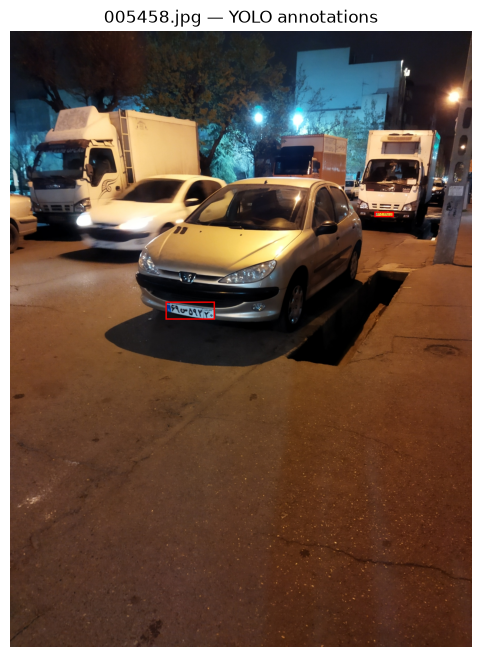

In [21]:

# Find an image containing exactly 2 plates
sample_label = next(
    p for p in label_files
    if len(p.read_text().strip().splitlines()) == 2
)

sample_image = image_dir / f"{sample_label.stem}.jpg"

# Load the image
image = Image.open(sample_image).convert("RGB")

width, height = image.size
draw = ImageDraw.Draw(image)

# Read and draw each YOLO bounding box
for line in sample_label.read_text().strip().splitlines():

    class_id, x_center, y_center, box_width, box_height = map(
        float, line.split()
    )

    # Convert normalized YOLO coordinates to pixels
    x_center *= width
    y_center *= height
    box_width *= width
    box_height *= height

    x1 = x_center - box_width / 2
    y1 = y_center - box_height / 2
    x2 = x_center + box_width / 2
    y2 = y_center + box_height / 2

    draw.rectangle([x1, y1, x2, y2], outline="red", width=3)

plt.figure(figsize=(12, 8))
plt.imshow(image)
plt.axis("off")
plt.title(f"{sample_image.name} — YOLO annotations")
plt.show()

## LPD image dimensions

In [22]:
image_sizes = []

for image_path in image_files:
    with Image.open(image_path) as img:
        image_sizes.append(img.size)   # (width, height)

size_counts = Counter(image_sizes)

print("Number of unique image sizes:", len(size_counts))
print("\nMost common sizes:")

for size, count in size_counts.most_common(10):
    print(f"{size}: {count} images")

Number of unique image sizes: 552

Most common sizes:
(1280, 960): 1665 images
(960, 1280): 1336 images
(720, 1280): 752 images
(1280, 720): 571 images
(949, 1280): 197 images
(1280, 719): 160 images
(600, 600): 144 images
(768, 1280): 117 images
(1280, 949): 115 images
(640, 480): 100 images


## Train Test split

In [25]:
SEED = 42

image_dir = LPD_DIR / "images"
label_dir = LPD_DIR / "labels"

# Original unsplit images
all_images = sorted([
    path for path in image_dir.glob("*.jpg")
    if path.is_file()
])

# First split:
# 80% train, 20% temporary
train_images, temp_images = train_test_split(
    all_images,
    test_size=0.20,
    random_state=SEED,
    shuffle=True
)

# Second split:
# Divide the temporary 20% equally -> 10% validation, 10% test
val_images, test_images = train_test_split(
    temp_images,
    test_size=0.50,
    random_state=SEED,
    shuffle=True
)

# Create destination folders
for split in ["train", "val", "test"]:
    (image_dir / split).mkdir(parents=True, exist_ok=True)
    (label_dir / split).mkdir(parents=True, exist_ok=True)


def copy_pair(image_path, split):
    """Copy an image and its matching YOLO label into one split."""

    label_path = label_dir / f"{image_path.stem}.txt"

    shutil.copy2(
        image_path,
        image_dir / split / image_path.name
    )

    shutil.copy2(
        label_path,
        label_dir / split / label_path.name
    )


for image_path in train_images:
    copy_pair(image_path, "train")

for image_path in val_images:
    copy_pair(image_path, "val")

for image_path in test_images:
    copy_pair(image_path, "test")


print("Train:", len(train_images))
print("Validation:", len(val_images))
print("Test:", len(test_images))
print("Total:", len(train_images) + len(val_images) + len(test_images))

Train: 5001
Validation: 625
Test: 626
Total: 6252


In [30]:
YOLO_YAML = CONFIG_DIR / "data.yaml"

dataset_config = {
    "path": str(LPD_DIR),
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",
    "nc": 1,
    "names": {
        0: "license_plate"
    }
}

with open(YOLO_YAML, "w") as f:
    yaml.safe_dump(
        dataset_config,
        f,
        sort_keys=False
    )

print(YOLO_YAML.read_text())

path: /Users/mahya/code/license_plate_detection/LPD_FILES
train: images/train
val: images/val
test: images/test
nc: 1
names:
  0: license_plate



### Configuration & Model Setup & Train

Define training hyperparameters, specify the dataset configuration path, and load the pretrained YOLO weights. Create this file and put it in the /content directory of Google Colab.

The yaml file (data.yaml) must have the following structure:
```
# Root directory of your dataset
path: /content/LPD_FILES

# Relative paths to image folders (relative to 'path' above)
train: images/train
val: images/val

# Number of classes and mapping from class ID to name
nc: 1
names:
  0: license_plate
```

In [31]:
smoke_model = YOLO("yolo26n.pt")

smoke_results = smoke_model.train(
    data=str(YOLO_YAML),
    epochs=1,
    imgsz=640,
    batch=16,
    device=DEVICE,
    project=str(DETECTOR_DIR),
    name="yolo_smoke_m4"
)

New https://pypi.org/project/ultralytics/8.4.159 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.157 🚀 Python-3.13.5 torch-2.14.0 MPS (Apple M4)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/Users/mahya/code/license_plate_detection/configs/data.yaml, degrees=0.0, deterministic=True, device=mps, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=1, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, m

/Users/mahya/code/license_plate_detection/.venv/lib/python3.13/site-packages/torch/autograd/graph.py:1072: UserWarning: index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


        1/1      5.19G      1.481      4.464   0.006603          9        640: 100% ━━━━━━━━━━━━ 313/313 1.3it/s 3:600.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 20/20 1.5it/s 13.6s0.6s
                   all        625        741      0.912      0.854      0.911      0.589

1 epochs completed in 0.071 hours.
Optimizer stripped from /Users/mahya/code/license_plate_detection/models/detector/yolo_smoke_m4/weights/last.pt, 5.4MB
Optimizer stripped from /Users/mahya/code/license_plate_detection/models/detector/yolo_smoke_m4/weights/best.pt, 5.4MB

Validating /Users/mahya/code/license_plate_detection/models/detector/yolo_smoke_m4/weights/best.pt...
Ultralytics 8.4.157 🚀 Python-3.13.5 torch-2.14.0 MPS (Apple M4)
YOLO26n summary (fused): 120 layers, 2,375,031 parameters, 0 gradients, 5.3 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 20/20 1.9it/s 10.4s0.5s


In [ ]:
model = YOLO("yolo26n.pt")
baseline_results = model.train(
    data=str(YOLO_YAML),
    epochs=20,
    patience=5,

    imgsz=640,
    batch=16,

    optimizer="AdamW",
    lr0=0.001,
    weight_decay=0.0005,
    cos_lr=True,

    device=0,

    project=str(DETECTOR_DIR),
    name="yolo_baseline",
    exist_ok=True
)

Ultralytics 8.4.157 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/codes/rahnema/license_plate_detection/runs/yolo_smoke_test/weights/best.pt, momentum=0.937, mosai

In [ ]:
yolo_pretrain_results = model.train(
    data=str(YOLO_YAML),
    epochs=50,
    patience=10,

    imgsz=640,
    batch=16,
    freeze=10,

    optimizer="AdamW",
    lr0=0.001,
    weight_decay=0.0005,
    cos_lr=True,

    device=0,

    project=str(DETECTOR_DIR),
    name="yolo_pretrain",
    exist_ok=True
)

Ultralytics 8.4.157 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=10, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/codes/rahnema/license_plate_detection/models/detector/yolo_baseline/weights/best.pt, momentum=0.937

In [32]:
baseline_model = YOLO(str(BASELINE_WEIGHTS))

baseline_metrics = baseline_model.val(
    data=str(YOLO_YAML),
    split="val",
    imgsz=640,
    batch=16,
    device=DEVICE,
    plots=True,
    project=str(OUTPUT_DIR / "detector"),
    name="baseline_validation"
)

print("Precision:", baseline_metrics.box.p[0])
print("Recall:", baseline_metrics.box.r[0])
print("mAP50:", baseline_metrics.box.map50)
print("mAP50-95:", baseline_metrics.box.map)

Ultralytics 8.4.157 🚀 Python-3.13.5 torch-2.14.0 MPS (Apple M4)
YOLO26n summary (fused): 120 layers, 2,375,031 parameters, 0 gradients, 5.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1503.9±473.6 MB/s, size: 769.0 KB)
val: Scanning /Users/mahya/code/license_plate_detection/LPD_FILES/labels/val.cache... 625 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 625/625 655.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 40/40 3.8it/s 10.5s0.2s
                   all        625        741      0.953      0.924      0.968      0.744
Speed: 0.1ms preprocess, 2.9ms inference, 0.0ms loss, 4.4ms postprocess per image
Results saved to /Users/mahya/code/license_plate_detection/outputs/detector/baseline_validation
Precision: 0.9531906075420824
Recall: 0.9244264507422402
mAP50: 0.9682293094687835
mAP50-95: 0.7435492376092583


### Inspect Results

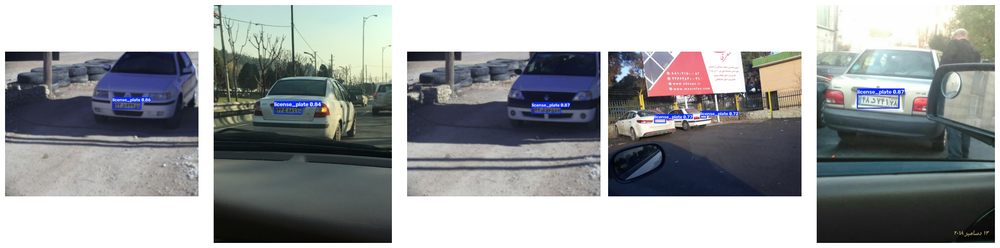

In [33]:
val_image_dir = LPD_DIR / "images" / "val"

sample_images = sorted(val_image_dir.glob("*.jpg"))[:5]

assert len(sample_images) == 5, "Could not find 5 validation images."

predictions = baseline_model.predict(
    source=[str(path) for path in sample_images],
    imgsz=640,
    conf=0.25,
    device=DEVICE,
    verbose=False
)

fig, axes = plt.subplots(1, 5, figsize=(20, 5))

for ax, result in zip(axes, predictions):
    annotated_image = result.plot()

    # Ultralytics returns BGR; matplotlib expects RGB
    ax.imshow(annotated_image[..., ::-1])
    ax.axis("off")

plt.tight_layout()
plt.show()

Found 20 training artifacts


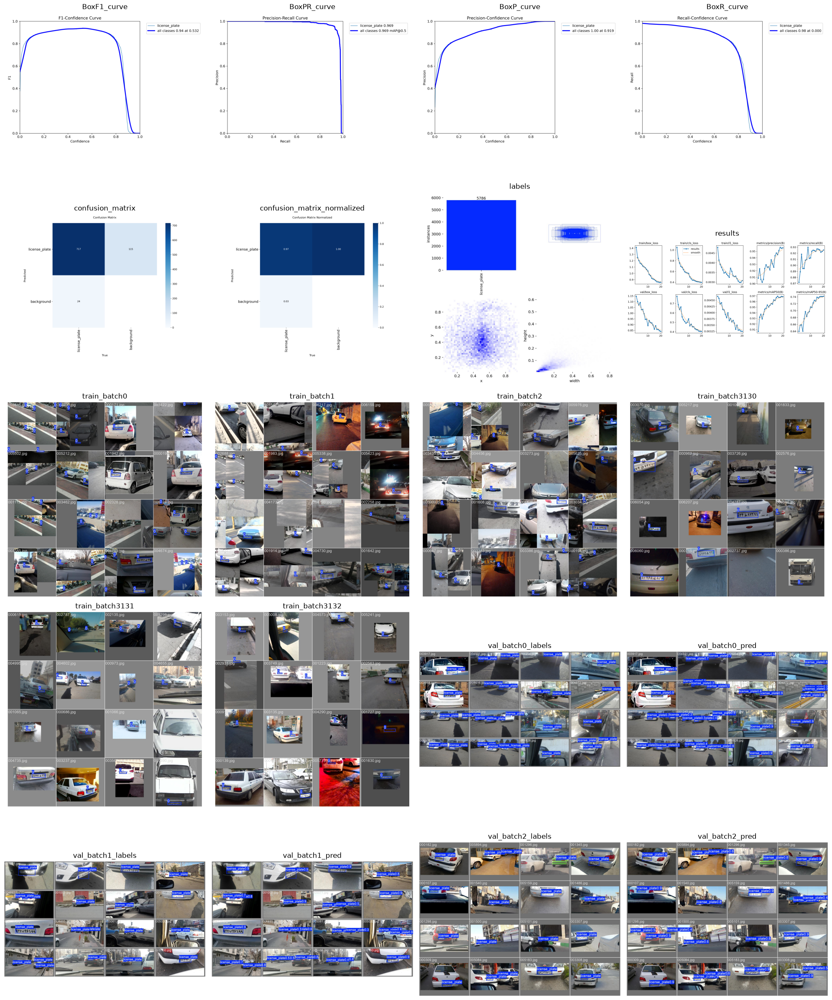

In [35]:
baseline_run_dir = DETECTOR_DIR / "yolo_baseline"

# Collect all Ultralytics-generated image artifacts
plot_files = sorted(
    list(baseline_run_dir.glob("*.png")) +
    list(baseline_run_dir.glob("*.jpg")) +
    list(baseline_run_dir.glob("*.jpeg"))
)

print(f"Found {len(plot_files)} training artifacts")

ncols = 4
nrows = (len(plot_files) + ncols - 1) // ncols

fig, axes = plt.subplots(
    nrows,
    ncols,
    figsize=(20, 5 * nrows)
)

axes = axes.flatten()

for ax, plot_path in zip(axes, plot_files):
    image = plt.imread(plot_path)
    ax.imshow(image)
    ax.set_title(plot_path.stem)
    ax.axis("off")

# Hide unused subplot spaces
for ax in axes[len(plot_files):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

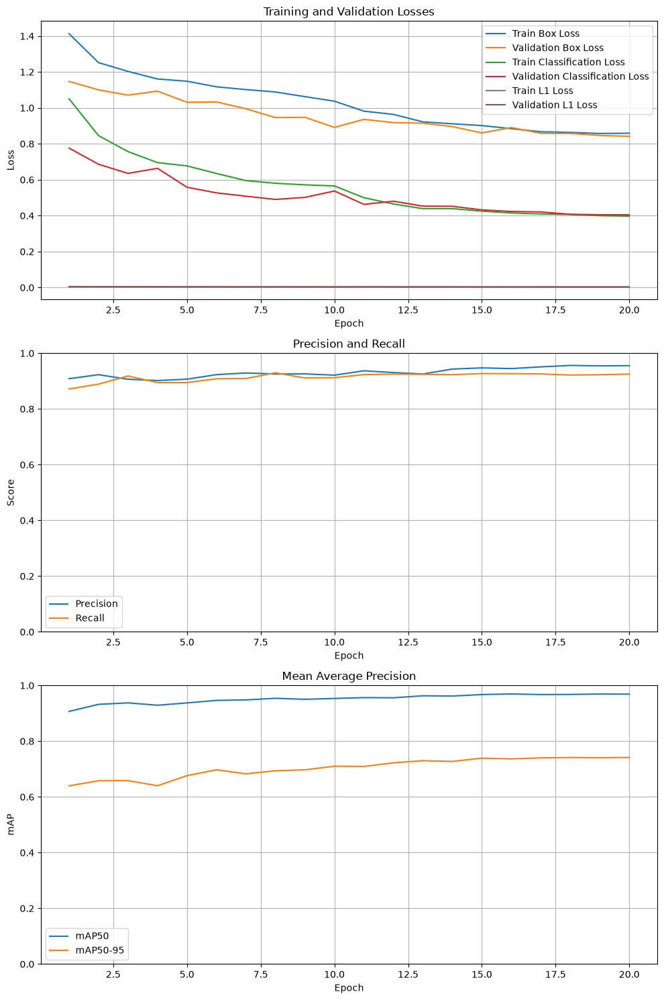

In [39]:
results_path = DETECTOR_DIR / "yolo_baseline" / "results.csv"

history = pd.read_csv(results_path)
history.columns = history.columns.str.strip()

epochs = history["epoch"]

# YOLO26 uses L1 localization loss instead of DFL
if "train/dfl_loss" in history.columns:
    train_loc_col = "train/dfl_loss"
    val_loc_col = "val/dfl_loss"
    loc_name = "DFL"
else:
    train_loc_col = "train/l1_loss"
    val_loc_col = "val/l1_loss"
    loc_name = "L1"


fig, axes = plt.subplots(3, 1, figsize=(10, 15))


# 1. All loss curves together
axes[0].plot(epochs, history["train/box_loss"], label="Train Box Loss")
axes[0].plot(epochs, history["val/box_loss"], label="Validation Box Loss")

axes[0].plot(epochs, history["train/cls_loss"], label="Train Classification Loss")
axes[0].plot(epochs, history["val/cls_loss"], label="Validation Classification Loss")

axes[0].plot(
    epochs,
    history[train_loc_col],
    label=f"Train {loc_name} Loss"
)
axes[0].plot(
    epochs,
    history[val_loc_col],
    label=f"Validation {loc_name} Loss"
)

axes[0].set_title("Training and Validation Losses")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].legend()
axes[0].grid(True)


# 2. Precision and recall
axes[1].plot(
    epochs,
    history["metrics/precision(B)"],
    label="Precision"
)

axes[1].plot(
    epochs,
    history["metrics/recall(B)"],
    label="Recall"
)

axes[1].set_title("Precision and Recall")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Score")
axes[1].set_ylim(0, 1)
axes[1].legend()
axes[1].grid(True)


# 3. mAP
axes[2].plot(
    epochs,
    history["metrics/mAP50(B)"],
    label="mAP50"
)

axes[2].plot(
    epochs,
    history["metrics/mAP50-95(B)"],
    label="mAP50-95"
)

axes[2].set_title("Mean Average Precision")
axes[2].set_xlabel("Epoch")
axes[2].set_ylabel("mAP")
axes[2].set_ylim(0, 1)
axes[2].legend()
axes[2].grid(True)


plt.tight_layout()
plt.show()

In [40]:
print("Final validation results")
print("------------------------")
print(f"Precision:  {baseline_metrics.box.p[0]:.4f}")
print(f"Recall:     {baseline_metrics.box.r[0]:.4f}")
print(f"mAP50:      {baseline_metrics.box.map50:.4f}")
print(f"mAP75:      {baseline_metrics.box.map75:.4f}")
print(f"mAP50-95:   {baseline_metrics.box.map:.4f}")

Final validation results
------------------------
Precision:  0.9532
Recall:     0.9244
mAP50:      0.9682
mAP75:      0.8704
mAP50-95:   0.7435


## 2. License Plate Recognition - CNN

### Data Load and Prepration

In [41]:
df = pd.read_csv(LPR_DIR / "valid_samples.csv")

train_df, test_df = train_test_split(
    df,
    test_size=0.10,
    random_state=42,
    shuffle=True
)

train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

print("Train Data Len:", len(train_df))
print("Test Data Len:", len(test_df))

df.head()

Train Data Len: 22104
Test Data Len: 2457


,image_path,label
0,1.jpg,98ع89511
1,2.jpg,19ش24611
2,3.jpg,25ت71433
3,4.jpg,95ت38633
4,5.jpg,44ه67355


#### PyTorch Dataset preparation

PyTorch separates **how one sample is loaded** from **how samples are grouped into batches**.

A custom `Dataset` is responsible for answering two questions:

- `__len__()` — how many samples are in the dataset?
- `__getitem__(index)` — for one index, how do we load the image and its corresponding target?

Later, a `DataLoader` will repeatedly call `__getitem__()` and combine the returned samples into batches.

Before implementing the dataset, we first verify how the image paths and plate labels are stored in the CSV so that the dataset does not depend on incorrect filesystem assumptions.

In [42]:
sample = train_df.iloc[0]

print("CSV image_path:", sample["image_path"])
print("Label:", sample["label"])
print("Label repr:", repr(sample["label"]))
print("Label length:", len(sample["label"]))

csv_path = Path(sample["image_path"])

print("\nPossible local paths:")
print("1:", LPR_DIR / csv_path)
print("   exists:", (LPR_DIR / csv_path).exists())

print("2:", LPR_DIR / "detections" / csv_path.name)
print("   exists:", (LPR_DIR / "detections" / csv_path.name).exists())

CSV image_path: 19227.jpg
Label: 61م84616
Label repr: '61م84616'
Label length: 8

Possible local paths:
1: /Users/mahya/code/license_plate_detection/LPR_FILES/19227.jpg
   exists: False
2: /Users/mahya/code/license_plate_detection/LPR_FILES/detections/19227.jpg
   exists: True


#### Custom PyTorch Dataset

The recognition CSV stores one row per license-plate image. Each row contains an image filename and its corresponding 8-character plate label.

A PyTorch `Dataset` provides a standard interface between this tabular metadata and the training pipeline. It inherits from `torch.utils.data.Dataset` and will eventually implement:

- `__init__`: store the dataframe and dataset configuration.
- `__len__`: report the number of available samples.
- `__getitem__`: load and return one image-label pair.

The image filenames in the CSV are resolved relative to the `detections/` directory.

Image type: <class 'PIL.Image.Image'>
Image size: (191, 49)
Label: 61م84616
Label length: 8


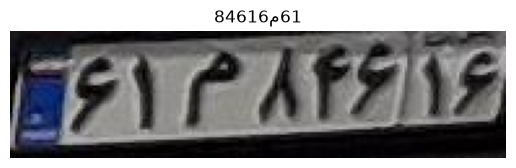

In [60]:
image, label = train_dataset[0]

print("Image type:", type(image))
print("Image size:", image.size)
print("Label:", label)
print("Label length:", len(label))

plt.imshow(image)
plt.title(label)
plt.axis("off")
plt.show()

In [48]:
# Inspect the classes appearing at each plate position
for position in range(8):
    values = sorted(train_df["label"].str[position].unique())

    print(
        f"Position {position}: "
        f"{len(values)} classes -> {values}"
    )

Position 0: 9 classes -> ['1', '2', '3', '4', '5', '6', '7', '8', '9']
Position 1: 9 classes -> ['1', '2', '3', '4', '5', '6', '7', '8', '9']
Position 2: 22 classes -> ['آ', 'ا', 'ب', 'ت', 'ث', 'ج', 'د', 'ز', 'س', 'ش', 'ص', 'ط', 'ع', 'ق', 'ل', 'م', 'ن', 'ه', 'و', 'پ', 'ژ', 'ی']
Position 3: 11 classes -> ['1', '2', '3', '4', '5', '6', '7', '8', '9', 'ل', '\u200d']
Position 4: 10 classes -> ['1', '2', '3', '4', '5', '6', '7', '8', '9', 'ف']
Position 5: 10 classes -> ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
Position 6: 10 classes -> ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
Position 7: 10 classes -> ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']


In [51]:
label_lengths = train_df["label"].str.len()

print("\nLabel lengths:")
print(label_lengths.value_counts().sort_index())


Label lengths:
label
8     21162
9       902
10       40
Name: count, dtype: int64


In [52]:
long_labels = train_df[train_df["label"].str.len() > 8]

for label in long_labels["label"].head(15):
    print("Label:", label)
    print("repr:", repr(label))
    print("length:", len(label))

    for i, char in enumerate(label):
        print(
            f"  {i}: {repr(char)} "
            f"Unicode=U+{ord(char):04X}"
        )

    print("-" * 40)

Label: 46ه‍17466
repr: '46ه\u200d17466'
length: 9
  0: '4' Unicode=U+0034
  1: '6' Unicode=U+0036
  2: 'ه' Unicode=U+0647
  3: '\u200d' Unicode=U+200D
  4: '1' Unicode=U+0031
  5: '7' Unicode=U+0037
  6: '4' Unicode=U+0034
  7: '6' Unicode=U+0036
  8: '6' Unicode=U+0036
----------------------------------------
Label: 26الف74722
repr: '26الف74722'
length: 10
  0: '2' Unicode=U+0032
  1: '6' Unicode=U+0036
  2: 'ا' Unicode=U+0627
  3: 'ل' Unicode=U+0644
  4: 'ف' Unicode=U+0641
  5: '7' Unicode=U+0037
  6: '4' Unicode=U+0034
  7: '7' Unicode=U+0037
  8: '2' Unicode=U+0032
  9: '2' Unicode=U+0032
----------------------------------------
Label: 48ه‍13933
repr: '48ه\u200d13933'
length: 9
  0: '4' Unicode=U+0034
  1: '8' Unicode=U+0038
  2: 'ه' Unicode=U+0647
  3: '\u200d' Unicode=U+200D
  4: '1' Unicode=U+0031
  5: '3' Unicode=U+0033
  6: '9' Unicode=U+0039
  7: '3' Unicode=U+0033
  8: '3' Unicode=U+0033
----------------------------------------
Label: 42ه‍23510
repr: '42ه\u200d23510'
length:

#### Plate-label parsing and normalization

The plate contains eight **logical positions**, but the Persian-letter position is not always one Unicode character.

For example:

- `ه‍` contains the letter `ه` plus a zero-width joiner (`U+200D`). The joiner is a rendering character and is removed during normalization.
- `الف` consists of three Unicode characters but represents one logical license-plate class and must remain a single token.

Therefore, labels are parsed structurally as:

`2 leading digits + Persian-letter token + 5 trailing digits`

rather than by assuming that every label contains exactly eight Unicode characters.

In [55]:
def split_plate_label(label):
    label = str(label)

    # First two positions are digits
    first_two = list(label[:2])

    # Last five positions are digits
    last_five = list(label[-5:])

    # Everything in between is the Persian-letter token
    letter = label[2:-5]

    # Remove formatting-only zero-width characters
    letter = (
        letter
        .replace("\u200d", "")   # zero-width joiner
        .replace("\u200c", "")   # zero-width non-joiner, if present
    )

    return first_two + [letter] + last_five

In [56]:
for label in [
    "61م84616",
    "46ه\u200d17466",
    "26الف74722",
]:
    parsed = split_plate_label(label)

    print("Original:", repr(label))
    print("Parsed:  ", parsed)
    print("Positions:", len(parsed))
    print()

Original: '61م84616'
Parsed:   ['6', '1', 'م', '8', '4', '6', '1', '6']
Positions: 8

Original: '46ه\u200d17466'
Parsed:   ['4', '6', 'ه', '1', '7', '4', '6', '6']
Positions: 8

Original: '26الف74722'
Parsed:   ['2', '6', 'الف', '7', '4', '7', '2', '2']
Positions: 8



In [57]:
class PlateLabelEncoder:

    def __init__(self, labels):

        # Parse every training label into 8 logical positions
        parsed_labels = [
            split_plate_label(label)
            for label in labels
        ]

        # All digit positions share the same digit vocabulary
        digit_positions = [0, 1, 3, 4, 5, 6, 7]

        digit_values = {
            plate[position]
            for plate in parsed_labels
            for position in digit_positions
        }

        letter_values = {
            plate[2]
            for plate in parsed_labels
        }

        # sorted() makes the mapping deterministic
        self.digit_classes = sorted(digit_values)
        self.letter_classes = sorted(letter_values)

        # String -> integer
        self.digit_to_idx = {
            digit: index
            for index, digit in enumerate(self.digit_classes)
        }

        self.letter_to_idx = {
            letter: index
            for index, letter in enumerate(self.letter_classes)
        }

        # Integer -> string
        self.idx_to_digit = {
            index: digit
            for digit, index in self.digit_to_idx.items()
        }

        self.idx_to_letter = {
            index: letter
            for letter, index in self.letter_to_idx.items()
        }

    def encode(self, label):

        plate = split_plate_label(label)

        encoded = []

        for position, token in enumerate(plate):

            if position == 2:
                encoded.append(
                    self.letter_to_idx[token]
                )
            else:
                encoded.append(
                    self.digit_to_idx[token]
                )

        return torch.tensor(encoded, dtype=torch.long)

    def decode(self, encoded):

        if isinstance(encoded, torch.Tensor):
            encoded = encoded.tolist()

        characters = []

        for position, class_index in enumerate(encoded):

            if position == 2:
                characters.append(
                    self.idx_to_letter[class_index]
                )
            else:
                characters.append(
                    self.idx_to_digit[class_index]
                )

        return "".join(characters)

In [58]:
label_encoder = PlateLabelEncoder(
    train_df["label"]
)

print("Digit classes:")
print(label_encoder.digit_classes)

print("\nPersian letter classes:")
print(label_encoder.letter_classes)

print("\nNumber of digit classes:",
      len(label_encoder.digit_classes))

print("Number of letter classes:",
      len(label_encoder.letter_classes))

Digit classes:
['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

Persian letter classes:
['آ', 'الف', 'ب', 'ت', 'ث', 'ج', 'د', 'ز', 'س', 'ش', 'ص', 'ط', 'ع', 'ق', 'ل', 'م', 'ن', 'ه', 'و', 'پ', 'ژ', 'ی']

Number of digit classes: 10
Number of letter classes: 22


In [59]:
example_label = "61م84616"

encoded = label_encoder.encode(example_label)
decoded = label_encoder.decode(encoded)

print("Original:", example_label)
print("Encoded:", encoded)
print("Shape:", encoded.shape)
print("dtype:", encoded.dtype)
print("Decoded:", decoded)

Original: 61م84616
Encoded: tensor([ 6,  1, 15,  8,  4,  6,  1,  6])
Shape: torch.Size([8])
dtype: torch.int64
Decoded: 61م84616


In [61]:
class PLPRDataset(torch.utils.data.Dataset):

    def __init__(
        self,
        dataframe,
        image_dir,
        label_encoder,
        transform=None
    ):
        self.dataframe = dataframe.reset_index(drop=True).copy()
        self.image_dir = Path(image_dir)
        self.label_encoder = label_encoder
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, index):

        # 1. Get one row from the dataframe
        row = self.dataframe.iloc[index]

        # 2. Build the full image path
        image_path = self.image_dir / row["image_path"]

        # 3. Load image as RGB
        image = Image.open(image_path).convert("RGB")

        # 4. Encode the plate label into 8 integer class IDs
        target = self.label_encoder.encode(row["label"])

        # 5. Apply image preprocessing if provided
        if self.transform is not None:
            image = self.transform(image)

        return image, target

In [62]:
train_dataset = PLPRDataset(
    dataframe=train_df,
    image_dir=LPR_DIR / "detections",
    label_encoder=label_encoder
)

test_dataset = PLPRDataset(
    dataframe=test_df,
    image_dir=LPR_DIR / "detections",
    label_encoder=label_encoder
)

Image type: <class 'PIL.Image.Image'>
Image size: (191, 49)

Target: tensor([ 6,  1, 15,  8,  4,  6,  1,  6])
Target shape: torch.Size([8])
Target dtype: torch.int64

Decoded target: 61م84616


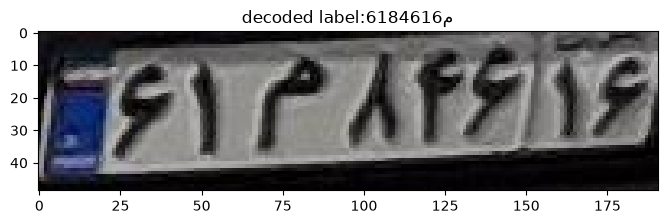

In [65]:
image, target = train_dataset[0]

print("Image type:", type(image))
print("Image size:", image.size)

print("\nTarget:", target)
print("Target shape:", target.shape)
print("Target dtype:", target.dtype)

decoded_label = label_encoder.decode(target)
print("\nDecoded target:", decoded_label)


plt.figure(figsize=(8,13))
plt.imshow(image)
plt.title(f'decoded label:{decoded_label}')
plt.show()


#### Image preprocessing

Images in a batch must have the same dimensions, so each license-plate image is resized to a fixed horizontal shape of `64 × 256`.

The plate is much wider than it is tall, so using a rectangular input preserves the important left-to-right character structure better than forcing the image into a square.

`ToTensor()` then converts the PIL image from shape `[H, W, C]` with pixel values `0–255` into a PyTorch tensor with shape `[C, H, W]` and values scaled to approximately `0–1`.

In [88]:
train_transform = transforms.Compose([
    transforms.Resize((IMAGE_HEIGHT, IMAGE_WIDTH)),

    transforms.RandomAffine(
        degrees=3,
        translate=(0.02, 0.03),
        scale=(0.95, 1.05)
    ),

    transforms.ColorJitter(
        brightness=0.15,
        contrast=0.15
    ),

    transforms.ToTensor()
])


eval_transform = transforms.Compose([
    transforms.Resize((IMAGE_HEIGHT, IMAGE_WIDTH)),
    transforms.ToTensor()
])

In [89]:
train_dataset = PLPRDataset(
    dataframe=train_df,
    image_dir=LPR_DIR / "detections",
    label_encoder=label_encoder,
    transform=eval_transform
)

test_dataset = PLPRDataset(
    dataframe=test_df,
    image_dir=LPR_DIR / "detections",
    label_encoder=label_encoder,
    transform=eval_transform
)

In [68]:
image, target = train_dataset[0]

print("Image type:", type(image))
print("Image shape:", image.shape)
print("Image dtype:", image.dtype)

print("Pixel range:",
      image.min().item(),
      "to",
      image.max().item())

print("\nTarget shape:", target.shape)
print("Target:", target)
print("Decoded:", label_encoder.decode(target))

Image type: <class 'torch.Tensor'>
Image shape: torch.Size([3, 64, 256])
Image dtype: torch.float32
Pixel range: 0.0 to 0.7686274647712708

Target shape: torch.Size([8])
Target: tensor([ 6,  1, 15,  8,  4,  6,  1,  6])
Decoded: 61م84616


#### DataLoaders

A PyTorch `DataLoader` wraps a `Dataset` and creates mini-batches for training or evaluation.

The training loader is shuffled so that the model sees samples in a different order each epoch. Validation and test loaders are not shuffled because their order does not affect evaluation.

The original test split is kept untouched. A validation subset is created from the training data and will be used during model development and checkpoint selection.

In [92]:
# Create validation data from the existing training split
train_model_df, val_df = train_test_split(
    train_df,
    test_size=0.10,
    random_state=42,
    shuffle=True
)

train_model_df = train_model_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

print("Training samples:", len(train_model_df))
print("Validation samples:", len(val_df))
print("Test samples:", len(test_df))


# Create datasets
train_dataset = PLPRDataset(
    dataframe=train_model_df,
    image_dir=LPR_DIR / "detections",
    label_encoder=label_encoder,
    transform=train_transform
)

val_dataset = PLPRDataset(
    dataframe=val_df,
    image_dir=LPR_DIR / "detections",
    label_encoder=label_encoder,
    transform=eval_transform
)

test_dataset = PLPRDataset(
    dataframe=test_df,
    image_dir=LPR_DIR / "detections",
    label_encoder=label_encoder,
    transform=eval_transform
)


# Create DataLoaders
BATCH_SIZE = 32

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0
)

val_loader = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

Training samples: 19893
Validation samples: 2211
Test samples: 2457


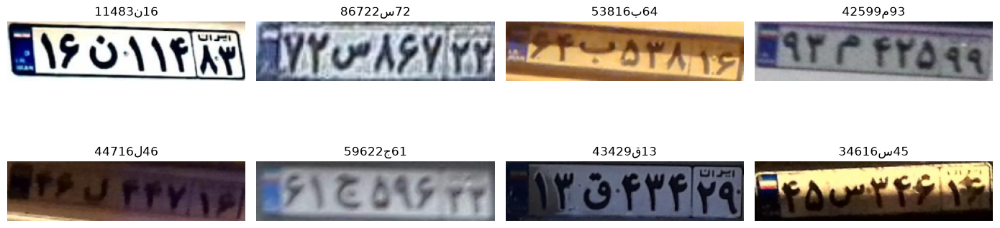

In [70]:
images, targets = next(iter(train_loader))

fig, axes = plt.subplots(2, 4, figsize=(14, 5))

for i, ax in enumerate(axes.flatten()):

    # PyTorch image: [C, H, W]
    # Matplotlib expects: [H, W, C]
    image = images[i].permute(1, 2, 0)

    label = label_encoder.decode(targets[i])

    ax.imshow(image)
    ax.set_title(label)
    ax.axis("off")

plt.tight_layout()
plt.show()

### Model Definition & Train

#### I. Design your model and train from scratch

### Custom CNN architecture

The recognition model receives a plate image with shape `[3, 64, 256]`.

The network will have two main parts:

1. A convolutional feature extractor that learns visual features such as edges, strokes, and character shapes.
2. Eight position-specific classification heads, one for each logical position in the license plate.

Because the characters have a fixed left-to-right order, the network should preserve horizontal information instead of collapsing the entire image into one feature vector.

In [71]:
class ConvBlock(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

    def forward(self, x):
        return self.block(x)

In [72]:
test_block = ConvBlock(
    in_channels=3,
    out_channels=32
)

dummy_batch = torch.randn(
    4, 3, 64, 256
)

output = test_block(dummy_batch)

print("Input shape: ", dummy_batch.shape)
print("Output shape:", output.shape)

Input shape:  torch.Size([4, 3, 64, 256])
Output shape: torch.Size([4, 32, 32, 128])


In [73]:
feature_extractor = nn.Sequential(
    ConvBlock(3, 32),
    ConvBlock(32, 64),
    ConvBlock(64, 128),
    ConvBlock(128, 256)
)

dummy_batch = torch.randn(4, 3, 64, 256)

x = dummy_batch

print("Input:", x.shape)

for i, layer in enumerate(feature_extractor, start=1):
    x = layer(x)
    print(f"After block {i}:", x.shape)

Input: torch.Size([4, 3, 64, 256])
After block 1: torch.Size([4, 32, 32, 128])
After block 2: torch.Size([4, 64, 16, 64])
After block 3: torch.Size([4, 128, 8, 32])
After block 4: torch.Size([4, 256, 4, 16])


In [74]:
position_pool = nn.AdaptiveAvgPool2d((1, 8))

dummy_features = torch.randn(4, 256, 4, 16)

pooled = position_pool(dummy_features)

print("Before pooling:", dummy_features.shape)
print("After pooling: ", pooled.shape)

Before pooling: torch.Size([4, 256, 4, 16])
After pooling:  torch.Size([4, 256, 1, 8])


In [75]:
position_features = pooled.squeeze(2).permute(0, 2, 1)

print("Position features:", position_features.shape)

Position features: torch.Size([4, 8, 256])


In [76]:
num_digit_classes = len(label_encoder.digit_classes)
num_letter_classes = len(label_encoder.letter_classes)

head_sizes = [
    num_digit_classes,   # position 0
    num_digit_classes,   # position 1
    num_letter_classes,  # position 2: Persian letter
    num_digit_classes,   # position 3
    num_digit_classes,   # position 4
    num_digit_classes,   # position 5
    num_digit_classes,   # position 6
    num_digit_classes    # position 7
]

classification_heads = nn.ModuleList([
    nn.Linear(256, num_classes)
    for num_classes in head_sizes
])

print("Head output sizes:", head_sizes)

Head output sizes: [10, 10, 22, 10, 10, 10, 10, 10]


In [77]:
logits = []

for position, head in enumerate(classification_heads):

    position_input = position_features[:, position, :]

    position_logits = head(position_input)

    logits.append(position_logits)

    print(
        f"Position {position}: "
        f"input {position_input.shape} -> "
        f"output {position_logits.shape}"
    )

Position 0: input torch.Size([4, 256]) -> output torch.Size([4, 10])
Position 1: input torch.Size([4, 256]) -> output torch.Size([4, 10])
Position 2: input torch.Size([4, 256]) -> output torch.Size([4, 22])
Position 3: input torch.Size([4, 256]) -> output torch.Size([4, 10])
Position 4: input torch.Size([4, 256]) -> output torch.Size([4, 10])
Position 5: input torch.Size([4, 256]) -> output torch.Size([4, 10])
Position 6: input torch.Size([4, 256]) -> output torch.Size([4, 10])
Position 7: input torch.Size([4, 256]) -> output torch.Size([4, 10])


In [78]:
class PlateRecognizerCNN(nn.Module):

    def __init__(
        self,
        num_digit_classes,
        num_letter_classes
    ):
        super().__init__()

        # Visual feature extractor
        self.feature_extractor = nn.Sequential(
            ConvBlock(3, 32),
            ConvBlock(32, 64),
            ConvBlock(64, 128),
            ConvBlock(128, 256)
        )

        # Convert spatial feature map into 8 horizontal positions
        self.position_pool = nn.AdaptiveAvgPool2d((1, 8))

        self.dropout = nn.Dropout(0.3)

        head_sizes = [
            num_digit_classes,   # position 0
            num_digit_classes,   # position 1
            num_letter_classes,  # position 2
            num_digit_classes,   # position 3
            num_digit_classes,   # position 4
            num_digit_classes,   # position 5
            num_digit_classes,   # position 6
            num_digit_classes    # position 7
        ]

        self.heads = nn.ModuleList([
            nn.Linear(256, num_classes)
            for num_classes in head_sizes
        ])

    def forward(self, x):

        # [B, 3, 64, 256]
        x = self.feature_extractor(x)

        # [B, 256, 4, 16]
        x = self.position_pool(x)

        # [B, 256, 1, 8]
        x = x.squeeze(2)

        # [B, 256, 8]
        x = x.permute(0, 2, 1)

        # [B, 8, 256]
        x = self.dropout(x)

        logits = []

        for position, head in enumerate(self.heads):

            position_features = x[:, position, :]

            position_logits = head(position_features)

            logits.append(position_logits)

        return logits

In [79]:
model = PlateRecognizerCNN(
    num_digit_classes=len(label_encoder.digit_classes),
    num_letter_classes=len(label_encoder.letter_classes)
)

model = model.to(DEVICE)

print("Device:", DEVICE)

num_parameters = sum(
    parameter.numel()
    for parameter in model.parameters()
)

print("Total parameters:", f"{num_parameters:,}")

Device: mps
Total parameters: 413,020


In [81]:
CUSTOM_MODEL_DIR = MODEL_DIR / "recognizer" / "custom_cnn"
CUSTOM_LOG_DIR = LOG_DIR / "recognizer" / "custom_cnn"
CUSTOM_OUTPUT_DIR = OUTPUT_DIR / "recognizer" / "custom_cnn"

CUSTOM_MODEL_DIR.mkdir(parents=True, exist_ok=True)
CUSTOM_LOG_DIR.mkdir(parents=True, exist_ok=True)
CUSTOM_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

BEST_MODEL_PATH = CUSTOM_MODEL_DIR / "best.pt"
LATEST_MODEL_PATH = CUSTOM_MODEL_DIR / "latest.pt"
HISTORY_PATH = CUSTOM_LOG_DIR / "history.csv"

print("Model directory:", CUSTOM_MODEL_DIR)
print("Log directory:", CUSTOM_LOG_DIR)
print("Output directory:", CUSTOM_OUTPUT_DIR)

Model directory: /Users/mahya/code/license_plate_detection/models/recognizer/custom_cnn
Log directory: /Users/mahya/code/license_plate_detection/logs/recognizer/custom_cnn
Output directory: /Users/mahya/code/license_plate_detection/outputs/recognizer/custom_cnn


In [80]:
images, targets = next(iter(train_loader))

images = images.to(DEVICE)
targets = targets.to(DEVICE)

outputs = model(images)

print("Number of outputs:", len(outputs))

for position, output in enumerate(outputs):
    print(
        f"Position {position}: {output.shape}"
    )

print("\nTarget shape:", targets.shape)

Number of outputs: 8
Position 0: torch.Size([32, 10])
Position 1: torch.Size([32, 10])
Position 2: torch.Size([32, 22])
Position 3: torch.Size([32, 10])
Position 4: torch.Size([32, 10])
Position 5: torch.Size([32, 10])
Position 6: torch.Size([32, 10])
Position 7: torch.Size([32, 10])

Target shape: torch.Size([32, 8])


#### Multi-head classification loss

Each plate position is a separate classification problem, so a Cross Entropy loss is calculated independently for each of the eight positions.

For position `i`:

- `outputs[i]` contains the model logits for that position
- `targets[:, i]` contains the correct class indices

The eight losses are averaged to produce one scalar loss used for backpropagation.

In [82]:
criterion = nn.CrossEntropyLoss()


def compute_plate_loss(outputs, targets):
    position_losses = []

    for position, output in enumerate(outputs):
        loss = criterion(
            output,
            targets[:, position]
        )

        position_losses.append(loss)

    total_loss = torch.stack(position_losses).mean()

    return total_loss, position_losses

In [83]:
images, targets = next(iter(train_loader))

images = images.to(DEVICE)
targets = targets.to(DEVICE)

outputs = model(images)

total_loss, position_losses = compute_plate_loss(
    outputs,
    targets
)

for position, loss in enumerate(position_losses):
    print(
        f"Position {position} loss: "
        f"{loss.item():.4f}"
    )

print(
    "\nAverage loss:",
    f"{total_loss.item():.4f}"
)

Position 0 loss: 2.5611
Position 1 loss: 2.4320
Position 2 loss: 3.3503
Position 3 loss: 2.4904
Position 4 loss: 2.3011
Position 5 loss: 2.8129
Position 6 loss: 2.2936
Position 7 loss: 2.5373

Average loss: 2.5973


### model check

In [84]:
debug_subset = torch.utils.data.Subset(
    train_dataset,
    range(16)
)

debug_loader = torch.utils.data.DataLoader(
    debug_subset,
    batch_size=16,
    shuffle=True,
    num_workers=0
)


# Separate model so the real model remains untouched
debug_model = PlateRecognizerCNN(
    num_digit_classes=len(label_encoder.digit_classes),
    num_letter_classes=len(label_encoder.letter_classes)
).to(DEVICE)


debug_optimizer = torch.optim.AdamW(
    debug_model.parameters(),
    lr=1e-3
)

In [86]:
MAX_DEBUG_EPOCHS = 150

for epoch in range(MAX_DEBUG_EPOCHS):

    debug_model.train()

    images, targets = next(iter(debug_loader))
    images = images.to(DEVICE)
    targets = targets.to(DEVICE)

    debug_optimizer.zero_grad()

    outputs = debug_model(images)
    loss, _ = compute_plate_loss(outputs, targets)

    loss.backward()
    debug_optimizer.step()

    predictions = torch.stack(
        [output.argmax(dim=1) for output in outputs],
        dim=1
    )

    character_accuracy = (
        predictions == targets
    ).float().mean().item()

    plate_accuracy = (
        predictions == targets
    ).all(dim=1).float().mean().item()

    if epoch % 10 == 0:
        print(
            f"Epoch {epoch:3d} | "
            f"Loss: {loss.item():.4f} | "
            f"Char Acc: {character_accuracy:.3f} | "
            f"Plate Acc: {plate_accuracy:.3f}"
        )

    if plate_accuracy == 1.0:
        print(f"\nSuccessfully overfit the batch at epoch {epoch}.")
        break

Epoch   0 | Loss: 2.6462 | Char Acc: 0.070 | Plate Acc: 0.000
Epoch  10 | Loss: 0.7504 | Char Acc: 0.883 | Plate Acc: 0.375

Successfully overfit the batch at epoch 18.


### Training

In [93]:
# Full training hyperparameters

NUM_EPOCHS = 20
LEARNING_RATE = 1e-3
WEIGHT_DECAY = 1e-4
EARLY_STOPPING_PATIENCE = 4

print("Epochs:", NUM_EPOCHS)
print("Learning rate:", LEARNING_RATE)
print("Weight decay:", WEIGHT_DECAY)
print("Early stopping patience:", EARLY_STOPPING_PATIENCE)

Epochs: 20
Learning rate: 0.001
Weight decay: 0.0001
Early stopping patience: 4


In [94]:
# model for full training

model = PlateRecognizerCNN(
    num_digit_classes=len(label_encoder.digit_classes),
    num_letter_classes=len(label_encoder.letter_classes)
).to(DEVICE)

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY
)

print("Device:", DEVICE)
print("Initial learning rate:", optimizer.param_groups[0]["lr"])

Device: mps
Initial learning rate: 0.001


In [95]:
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=2
)

print("Scheduler:", scheduler.__class__.__name__)

Scheduler: ReduceLROnPlateau


In [96]:
history = {
    "train_loss": [],
    "val_loss": [],
    "train_char_acc": [],
    "val_char_acc": [],
    "train_plate_acc": [],
    "val_plate_acc": [],
    "grad_norm": [],
    "learning_rate": []
}

best_val_loss = float("inf")
epochs_without_improvement = 0

print("Training history initialized.")

Training history initialized.


In [97]:
def train_one_epoch(model, loader, optimizer, device):

    model.train()

    total_loss = 0.0
    total_correct_chars = 0
    total_chars = 0
    total_correct_plates = 0
    total_plates = 0
    total_grad_norm = 0.0

    for images, targets in loader:

        images = images.to(device)
        targets = targets.to(device)

        # Clear gradients from previous batch
        optimizer.zero_grad(set_to_none=True)

        # Forward pass
        outputs = model(images)

        # Compute average loss across the 8 positions
        loss, _ = compute_plate_loss(outputs, targets)

        # Backpropagation
        loss.backward()

        # Calculate gradient norm before updating weights
        grad_norm_squared = 0.0

        for parameter in model.parameters():
            if parameter.grad is not None:
                parameter_norm = parameter.grad.detach().norm(2).item()
                grad_norm_squared += parameter_norm ** 2

        grad_norm = grad_norm_squared ** 0.5

        # Update model parameters
        optimizer.step()

        # Convert logits to predicted class indices
        predictions = torch.stack(
            [output.argmax(dim=1) for output in outputs],
            dim=1
        )

        # Character-level accuracy
        total_correct_chars += (
            predictions == targets
        ).sum().item()

        total_chars += targets.numel()

        # Full-plate accuracy:
        # a plate counts as correct only if all 8 positions match
        total_correct_plates += (
            predictions == targets
        ).all(dim=1).sum().item()

        total_plates += targets.size(0)

        # Multiply by batch size so the final average is per sample
        total_loss += loss.item() * targets.size(0)

        total_grad_norm += grad_norm

    average_loss = total_loss / total_plates
    character_accuracy = total_correct_chars / total_chars
    plate_accuracy = total_correct_plates / total_plates
    average_grad_norm = total_grad_norm / len(loader)

    return (
        average_loss,
        character_accuracy,
        plate_accuracy,
        average_grad_norm
    )

In [98]:
def evaluate_model(model, loader, device):

    model.eval()

    total_loss = 0.0
    total_correct_chars = 0
    total_chars = 0
    total_correct_plates = 0
    total_plates = 0

    with torch.no_grad():

        for images, targets in loader:

            images = images.to(device)
            targets = targets.to(device)

            # Forward pass only
            outputs = model(images)

            loss, _ = compute_plate_loss(outputs, targets)

            predictions = torch.stack(
                [output.argmax(dim=1) for output in outputs],
                dim=1
            )

            # Character-level accuracy
            total_correct_chars += (
                predictions == targets
            ).sum().item()

            total_chars += targets.numel()

            # Full-plate accuracy
            total_correct_plates += (
                predictions == targets
            ).all(dim=1).sum().item()

            total_plates += targets.size(0)

            total_loss += loss.item() * targets.size(0)

    average_loss = total_loss / total_plates
    character_accuracy = total_correct_chars / total_chars
    plate_accuracy = total_correct_plates / total_plates

    return (
        average_loss,
        character_accuracy,
        plate_accuracy
    )

In [99]:
import pandas as pd

for epoch in range(NUM_EPOCHS):

    # -------------------------
    # Train
    # -------------------------
    (
        train_loss,
        train_char_acc,
        train_plate_acc,
        grad_norm
    ) = train_one_epoch(
        model,
        train_loader,
        optimizer,
        DEVICE
    )

    # -------------------------
    # Validate
    # -------------------------
    (
        val_loss,
        val_char_acc,
        val_plate_acc
    ) = evaluate_model(
        model,
        val_loader,
        DEVICE
    )

    # Learning rate used during this epoch
    current_lr = optimizer.param_groups[0]["lr"]

    # -------------------------
    # Save history
    # -------------------------
    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)

    history["train_char_acc"].append(train_char_acc)
    history["val_char_acc"].append(val_char_acc)

    history["train_plate_acc"].append(train_plate_acc)
    history["val_plate_acc"].append(val_plate_acc)

    history["grad_norm"].append(grad_norm)
    history["learning_rate"].append(current_lr)

    # Save history to disk after every epoch
    pd.DataFrame(history).to_csv(
        HISTORY_PATH,
        index=False
    )

    # -------------------------
    # Update learning rate
    # -------------------------
    scheduler.step(val_loss)

    # -------------------------
    # Save latest checkpoint
    # -------------------------
    checkpoint = {
        "epoch": epoch + 1,

        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": scheduler.state_dict(),

        "val_loss": val_loss,

        "digit_classes": label_encoder.digit_classes,
        "letter_classes": label_encoder.letter_classes,

        "image_height": IMAGE_HEIGHT,
        "image_width": IMAGE_WIDTH,

        "batch_size": BATCH_SIZE,
        "learning_rate": LEARNING_RATE,
        "weight_decay": WEIGHT_DECAY
    }

    torch.save(
        checkpoint,
        LATEST_MODEL_PATH
    )

    # -------------------------
    # Save best checkpoint
    # -------------------------
    if val_loss < best_val_loss:

        best_val_loss = val_loss
        epochs_without_improvement = 0

        torch.save(
            checkpoint,
            BEST_MODEL_PATH
        )

        best_marker = " <-- best"

    else:
        epochs_without_improvement += 1
        best_marker = ""

    # -------------------------
    # Print epoch results
    # -------------------------
    print(
        f"Epoch {epoch + 1:02d}/{NUM_EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Val Loss: {val_loss:.4f} | "
        f"Train Char Acc: {train_char_acc:.3f} | "
        f"Val Char Acc: {val_char_acc:.3f} | "
        f"Train Plate Acc: {train_plate_acc:.3f} | "
        f"Val Plate Acc: {val_plate_acc:.3f} | "
        f"LR: {current_lr:.6f}"
        f"{best_marker}"
    )

    # -------------------------
    # Early stopping
    # -------------------------
    if epochs_without_improvement >= EARLY_STOPPING_PATIENCE:
        print(
            f"\nEarly stopping after epoch {epoch + 1}."
        )
        break

Epoch 01/20 | Train Loss: 1.2581 | Val Loss: 0.5408 | Train Char Acc: 0.578 | Val Char Acc: 0.840 | Train Plate Acc: 0.189 | Val Plate Acc: 0.494 | LR: 0.001000 <-- best
Epoch 02/20 | Train Loss: 0.4459 | Val Loss: 0.3575 | Train Char Acc: 0.869 | Val Char Acc: 0.890 | Train Plate Acc: 0.545 | Val Plate Acc: 0.654 | LR: 0.001000 <-- best
Epoch 03/20 | Train Loss: 0.3480 | Val Loss: 0.2651 | Train Char Acc: 0.897 | Val Char Acc: 0.919 | Train Plate Acc: 0.622 | Val Plate Acc: 0.701 | LR: 0.001000 <-- best
Epoch 04/20 | Train Loss: 0.3076 | Val Loss: 0.2102 | Train Char Acc: 0.909 | Val Char Acc: 0.940 | Train Plate Acc: 0.655 | Val Plate Acc: 0.761 | LR: 0.001000 <-- best
Epoch 05/20 | Train Loss: 0.2779 | Val Loss: 0.2178 | Train Char Acc: 0.917 | Val Char Acc: 0.935 | Train Plate Acc: 0.680 | Val Plate Acc: 0.744 | LR: 0.001000
Epoch 06/20 | Train Loss: 0.2553 | Val Loss: 0.1861 | Train Char Acc: 0.924 | Val Char Acc: 0.948 | Train Plate Acc: 0.697 | Val Plate Acc: 0.785 | LR: 0.00100

In [100]:
history_df = pd.read_csv(HISTORY_PATH)

best_epoch = history_df["val_loss"].idxmin()

print("Epochs completed:", len(history_df))
print("Best epoch:", best_epoch + 1)
print()
print(history_df.iloc[best_epoch])
print()
print("Best checkpoint saved:", BEST_MODEL_PATH.exists())
print("Latest checkpoint saved:", LATEST_MODEL_PATH.exists())

Epochs completed: 20
Best epoch: 20

train_loss         0.160355
val_loss           0.127431
train_char_acc     0.951340
val_char_acc       0.963252
train_plate_acc    0.776705
val_plate_acc      0.828132
grad_norm          0.957877
learning_rate      0.001000
Name: 19, dtype: float64

Best checkpoint saved: True
Latest checkpoint saved: True


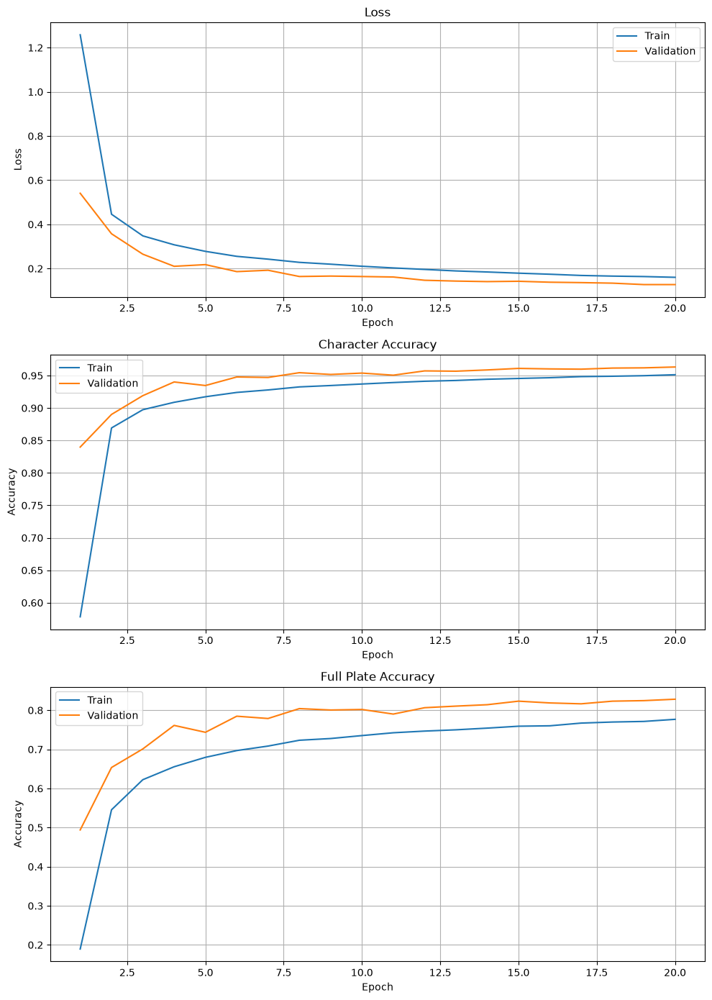

In [101]:
fig, axes = plt.subplots(3, 1, figsize=(10, 14))

epochs = range(1, len(history_df) + 1)

# Loss
axes[0].plot(epochs, history_df["train_loss"], label="Train")
axes[0].plot(epochs, history_df["val_loss"], label="Validation")
axes[0].set_title("Loss")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].legend()
axes[0].grid(True)

# Character accuracy
axes[1].plot(epochs, history_df["train_char_acc"], label="Train")
axes[1].plot(epochs, history_df["val_char_acc"], label="Validation")
axes[1].set_title("Character Accuracy")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Accuracy")
axes[1].legend()
axes[1].grid(True)

# Full-plate accuracy
axes[2].plot(epochs, history_df["train_plate_acc"], label="Train")
axes[2].plot(epochs, history_df["val_plate_acc"], label="Validation")
axes[2].set_title("Full Plate Accuracy")
axes[2].set_xlabel("Epoch")
axes[2].set_ylabel("Accuracy")
axes[2].legend()
axes[2].grid(True)

plt.tight_layout()
plt.show()

#### Reload the CNN model

In [102]:
# Reload the best saved custom CNN checkpoint

checkpoint = torch.load(
    BEST_MODEL_PATH,
    map_location=DEVICE
)

best_custom_model = PlateRecognizerCNN(
    num_digit_classes=len(checkpoint["digit_classes"]),
    num_letter_classes=len(checkpoint["letter_classes"])
).to(DEVICE)

best_custom_model.load_state_dict(
    checkpoint["model_state_dict"]
)

best_custom_model.eval()

print("Loaded checkpoint from epoch:", checkpoint["epoch"])
print("Saved validation loss:", checkpoint["val_loss"])
print("Best custom CNN loaded successfully.")

Loaded checkpoint from epoch: 20
Saved validation loss: 0.12743104140900585
Best custom CNN loaded successfully.


#### II. Use pre-trained models as backbones, adopt, and fine-tune

In [106]:

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

mobilenet_v3_small_train_transform = transforms.Compose([
    transforms.Resize(
        (IMAGE_HEIGHT, IMAGE_WIDTH),
        interpolation=InterpolationMode.BILINEAR
    ),
    transforms.RandomAffine(
        degrees=3,
        translate=(0.02, 0.03),
        scale=(0.95, 1.05)
    ),
    transforms.ColorJitter(
        brightness=0.15,
        contrast=0.15
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD
    )
])

mobilenet_v3_small_eval_transform = transforms.Compose([
    transforms.Resize(
        (IMAGE_HEIGHT, IMAGE_WIDTH),
        interpolation=InterpolationMode.BILINEAR
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD
    )
])

#### DataLoader

In [107]:
mobilenet_v3_small_train_dataset = PLPRDataset(
    dataframe=train_model_df,
    image_dir=LPR_DIR / "detections",
    label_encoder=label_encoder,
    transform=mobilenet_v3_small_train_transform
)

mobilenet_v3_small_val_dataset = PLPRDataset(
    dataframe=val_df,
    image_dir=LPR_DIR / "detections",
    label_encoder=label_encoder,
    transform=mobilenet_v3_small_eval_transform
)

mobilenet_v3_small_test_dataset = PLPRDataset(
    dataframe=test_df,
    image_dir=LPR_DIR / "detections",
    label_encoder=label_encoder,
    transform=mobilenet_v3_small_eval_transform
)


mobilenet_v3_small_train_loader = torch.utils.data.DataLoader(
    mobilenet_v3_small_train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0
)

mobilenet_v3_small_val_loader = torch.utils.data.DataLoader(
    mobilenet_v3_small_val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

mobilenet_v3_small_test_loader = torch.utils.data.DataLoader(
    mobilenet_v3_small_test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

print("MobileNetV3-Small loaders created.")

MobileNetV3-Small loaders created.


In [108]:
from torchvision.models import (
    mobilenet_v3_small,
    MobileNet_V3_Small_Weights
)


class MobileNetV3SmallPlateRecognizer(nn.Module):

    def __init__(
        self,
        num_digit_classes,
        num_letter_classes
    ):
        super().__init__()

        # Load ImageNet-pretrained MobileNetV3-Small
        weights = MobileNet_V3_Small_Weights.DEFAULT
        pretrained_model = mobilenet_v3_small(weights=weights)

        # Keep only the convolutional feature extractor
        self.features = pretrained_model.features

        # Number of channels produced by the MobileNet backbone
        self.feature_dim = pretrained_model.classifier[0].in_features

        # Preserve 8 horizontal plate positions
        self.position_pool = nn.AdaptiveAvgPool2d((1, 8))

        self.dropout = nn.Dropout(0.3)

        head_sizes = [
            num_digit_classes,
            num_digit_classes,
            num_letter_classes,
            num_digit_classes,
            num_digit_classes,
            num_digit_classes,
            num_digit_classes,
            num_digit_classes
        ]

        self.heads = nn.ModuleList([
            nn.Linear(self.feature_dim, num_classes)
            for num_classes in head_sizes
        ])

    def forward(self, x):

        # Pretrained MobileNet feature extraction
        x = self.features(x)

        # Convert feature map into 8 horizontal regions
        x = self.position_pool(x)

        # [B, C, 1, 8] -> [B, C, 8]
        x = x.squeeze(2)

        # [B, C, 8] -> [B, 8, C]
        x = x.permute(0, 2, 1)

        x = self.dropout(x)

        logits = []

        for position, head in enumerate(self.heads):
            position_features = x[:, position, :]
            position_logits = head(position_features)
            logits.append(position_logits)

        return logits

In [ ]:
mobilenet_v3_small_model = MobileNetV3SmallPlateRecognizer(
    num_digit_classes=len(label_encoder.digit_classes),
    num_letter_classes=len(label_encoder.letter_classes)
).to(DEVICE)

images, targets = next(iter(mobilenet_v3_small_train_loader))

images = images.to(DEVICE)
targets = targets.to(DEVICE)

with torch.no_grad():
    outputs = mobilenet_v3_small_model(images)

print("Input shape:", images.shape)
print("Number of outputs:", len(outputs))

for position, output in enumerate(outputs):
    print(f"Position {position}: {output.shape}")

num_parameters = sum(
    p.numel()
    for p in mobilenet_v3_small_model.parameters()
)

trainable_parameters = sum(
    p.numel()
    for p in mobilenet_v3_small_model.parameters()
    if p.requires_grad
)

print("\nTotal parameters:", f"{num_parameters:,}")
print("Trainable parameters:", f"{trainable_parameters:,}")

Downloading: "https://download.pytorch.org/models/mobilenet_v3_small-047dcff4.pth" to /Users/mahya/.cache/torch/hub/checkpoints/mobilenet_v3_small-047dcff4.pth


100%|██████████| 9.83M/9.83M [00:07<00:00, 1.32MB/s]


Input shape: torch.Size([32, 3, 64, 256])
Number of outputs: 8
Position 0: torch.Size([32, 10])
Position 1: torch.Size([32, 10])
Position 2: torch.Size([32, 22])
Position 3: torch.Size([32, 10])
Position 4: torch.Size([32, 10])
Position 5: torch.Size([32, 10])
Position 6: torch.Size([32, 10])
Position 7: torch.Size([32, 10])

Total parameters: 980,092
Trainable parameters: 980,092


#### freeze the pretrained backbone

In [110]:
for parameter in mobilenet_v3_small_model.features.parameters():
    parameter.requires_grad = False

mobilenet_v3_small_trainable_parameters = sum(
    parameter.numel()
    for parameter in mobilenet_v3_small_model.parameters()
    if parameter.requires_grad
)

mobilenet_v3_small_frozen_parameters = sum(
    parameter.numel()
    for parameter in mobilenet_v3_small_model.parameters()
    if not parameter.requires_grad
)

print(
    "Trainable parameters:",
    f"{mobilenet_v3_small_trainable_parameters:,}"
)

print(
    "Frozen parameters:",
    f"{mobilenet_v3_small_frozen_parameters:,}"
)

Trainable parameters: 53,084
Frozen parameters: 927,008


#### Configs path

In [ ]:
import json

MOBILENET_V3_SMALL_RUN_DIR = (
    MODEL_DIR / "recognizer" / "mobilenet_v3_small" / "frozen_backbone"
)

MOBILENET_V3_SMALL_RUN_LOG_DIR = (
    LOG_DIR / "recognizer" / "mobilenet_v3_small" / "frozen_backbone"
)

MOBILENET_V3_SMALL_RUN_DIR.mkdir(parents=True, exist_ok=True)
MOBILENET_V3_SMALL_RUN_LOG_DIR.mkdir(parents=True, exist_ok=True)

MOBILENET_V3_SMALL_BEST_PATH = (
    MOBILENET_V3_SMALL_RUN_DIR / "best.pt"
)

MOBILENET_V3_SMALL_LATEST_PATH = (
    MOBILENET_V3_SMALL_RUN_DIR / "latest.pt"
)

MOBILENET_V3_SMALL_HISTORY_PATH = (
    MOBILENET_V3_SMALL_RUN_LOG_DIR / "history.csv"
)

MOBILENET_V3_SMALL_CONFIG_PATH = (
    MOBILENET_V3_SMALL_RUN_LOG_DIR / "training_config.json"
)

mobilenet_v3_small_config = {
    "model": "MobileNetV3-Small",
    "pretrained": True,
    "training_stage": "frozen_backbone",
    "image_height": IMAGE_HEIGHT,
    "image_width": IMAGE_WIDTH,
    "batch_size": BATCH_SIZE,
    "epochs": MOBILENET_V3_SMALL_HEAD_EPOCHS,
    "learning_rate": MOBILENET_V3_SMALL_HEAD_LR,
    "weight_decay": MOBILENET_V3_SMALL_WEIGHT_DECAY,
    "device": DEVICE,
    "num_digit_classes": len(label_encoder.digit_classes),
    "num_letter_classes": len(label_encoder.letter_classes)
}

with open(
    MOBILENET_V3_SMALL_CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:
    json.dump(
        mobilenet_v3_small_config,
        f,
        indent=4,
        ensure_ascii=False
    )

print("Corrected MobileNet run configured.")
print("Config saved to:", MOBILENET_V3_SMALL_CONFIG_PATH)

####  optimizer for frozen-backbone training

In [ ]:
mobilenet_v3_small_optimizer = torch.optim.AdamW(
    filter(
        lambda parameter: parameter.requires_grad,
        mobilenet_v3_small_model.parameters()
    ),
    lr=MOBILENET_V3_SMALL_HEAD_LR,
    weight_decay=MOBILENET_V3_SMALL_WEIGHT_DECAY
)

print(
    "Learning rate:",
    mobilenet_v3_small_optimizer.param_groups[0]["lr"]
)

print(
    "Trainable parameters:",
    sum(
        p.numel()
        for p in mobilenet_v3_small_model.parameters()
        if p.requires_grad
    )
)

In [ ]:
mobilenet_v3_small_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    mobilenet_v3_small_optimizer,
    mode="min",
    factor=0.5,
    patience=1
)

mobilenet_v3_small_history = {
    "train_loss": [],
    "val_loss": [],
    "train_char_acc": [],
    "val_char_acc": [],
    "train_plate_acc": [],
    "val_plate_acc": [],
    "grad_norm": [],
    "learning_rate": []
}

mobilenet_v3_small_best_val_loss = float("inf")

print("Corrected MobileNet training state reset.")

In [117]:
def train_one_epoch_frozen_mobilenet(
    model,
    loader,
    optimizer,
    device
):

    # Put the whole model in training mode
    model.train()

    # But keep the frozen MobileNet backbone in eval mode
    # so BatchNorm running statistics do not change.
    model.features.eval()

    total_loss = 0.0
    total_correct_chars = 0
    total_chars = 0
    total_correct_plates = 0
    total_plates = 0
    total_grad_norm = 0.0

    for images, targets in loader:

        images = images.to(device)
        targets = targets.to(device)

        optimizer.zero_grad(set_to_none=True)

        outputs = model(images)

        loss, _ = compute_plate_loss(
            outputs,
            targets
        )

        loss.backward()

        grad_norm_squared = 0.0

        for parameter in model.parameters():
            if parameter.grad is not None:
                parameter_norm = (
                    parameter.grad.detach().norm(2).item()
                )
                grad_norm_squared += parameter_norm ** 2

        grad_norm = grad_norm_squared ** 0.5

        optimizer.step()

        predictions = torch.stack(
            [
                output.argmax(dim=1)
                for output in outputs
            ],
            dim=1
        )

        total_correct_chars += (
            predictions == targets
        ).sum().item()

        total_chars += targets.numel()

        total_correct_plates += (
            predictions == targets
        ).all(dim=1).sum().item()

        total_plates += targets.size(0)

        total_loss += (
            loss.item() * targets.size(0)
        )

        total_grad_norm += grad_norm

    return (
        total_loss / total_plates,
        total_correct_chars / total_chars,
        total_correct_plates / total_plates,
        total_grad_norm / len(loader)
    )

#### run corrected mobilenet model

In [121]:
for epoch in range(MOBILENET_V3_SMALL_HEAD_EPOCHS):

    (
        train_loss,
        train_char_acc,
        train_plate_acc,
        grad_norm
    ) = train_one_epoch_frozen_mobilenet(
        mobilenet_v3_small_model,
        mobilenet_v3_small_train_loader,
        mobilenet_v3_small_optimizer,
        DEVICE
    )

    (
        val_loss,
        val_char_acc,
        val_plate_acc
    ) = evaluate_model(
        mobilenet_v3_small_model,
        mobilenet_v3_small_val_loader,
        DEVICE
    )

    current_lr = mobilenet_v3_small_optimizer.param_groups[0]["lr"]

    mobilenet_v3_small_history["train_loss"].append(train_loss)
    mobilenet_v3_small_history["val_loss"].append(val_loss)
    mobilenet_v3_small_history["train_char_acc"].append(train_char_acc)
    mobilenet_v3_small_history["val_char_acc"].append(val_char_acc)
    mobilenet_v3_small_history["train_plate_acc"].append(train_plate_acc)
    mobilenet_v3_small_history["val_plate_acc"].append(val_plate_acc)
    mobilenet_v3_small_history["grad_norm"].append(grad_norm)
    mobilenet_v3_small_history["learning_rate"].append(current_lr)

    pd.DataFrame(
        mobilenet_v3_small_history
    ).to_csv(
        MOBILENET_V3_SMALL_HISTORY_PATH,
        index=False
    )

    mobilenet_v3_small_scheduler.step(val_loss)

    mobilenet_checkpoint = {
        "stage": "frozen_backbone",
        "epoch": epoch + 1,
        "model_state_dict": mobilenet_v3_small_model.state_dict(),
        "optimizer_state_dict": mobilenet_v3_small_optimizer.state_dict(),
        "scheduler_state_dict": mobilenet_v3_small_scheduler.state_dict(),
        "val_loss": val_loss,
        "digit_classes": label_encoder.digit_classes,
        "letter_classes": label_encoder.letter_classes,
        "image_height": IMAGE_HEIGHT,
        "image_width": IMAGE_WIDTH,
        "batch_size": BATCH_SIZE,
        "learning_rate": MOBILENET_V3_SMALL_HEAD_LR,
        "weight_decay": MOBILENET_V3_SMALL_WEIGHT_DECAY
    }

    torch.save(
        mobilenet_checkpoint,
        MOBILENET_V3_SMALL_LATEST_PATH
    )

    if val_loss < mobilenet_v3_small_best_val_loss:

        mobilenet_v3_small_best_val_loss = val_loss

        torch.save(
            mobilenet_checkpoint,
            MOBILENET_V3_SMALL_BEST_PATH
        )

        best_marker = " <-- best"

    else:
        best_marker = ""

    print(
        f"Epoch {epoch + 1:02d}/"
        f"{MOBILENET_V3_SMALL_HEAD_EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Val Loss: {val_loss:.4f} | "
        f"Train Char Acc: {train_char_acc:.3f} | "
        f"Val Char Acc: {val_char_acc:.3f} | "
        f"Train Plate Acc: {train_plate_acc:.3f} | "
        f"Val Plate Acc: {val_plate_acc:.3f} | "
        f"LR: {current_lr:.6f}"
        f"{best_marker}"
    )

Epoch 01/5 | Train Loss: 1.9416 | Val Loss: 1.7499 | Train Char Acc: 0.307 | Val Char Acc: 0.393 | Train Plate Acc: 0.000 | Val Plate Acc: 0.000 | LR: 0.001000 <-- best
Epoch 02/5 | Train Loss: 1.7803 | Val Loss: 1.6697 | Train Char Acc: 0.370 | Val Char Acc: 0.422 | Train Plate Acc: 0.001 | Val Plate Acc: 0.000 | LR: 0.001000 <-- best
Epoch 03/5 | Train Loss: 1.7388 | Val Loss: 1.6280 | Train Char Acc: 0.386 | Val Char Acc: 0.438 | Train Plate Acc: 0.001 | Val Plate Acc: 0.003 | LR: 0.001000 <-- best
Epoch 04/5 | Train Loss: 1.7184 | Val Loss: 1.6093 | Train Char Acc: 0.393 | Val Char Acc: 0.440 | Train Plate Acc: 0.001 | Val Plate Acc: 0.002 | LR: 0.001000 <-- best
Epoch 05/5 | Train Loss: 1.7078 | Val Loss: 1.6034 | Train Char Acc: 0.397 | Val Char Acc: 0.446 | Train Plate Acc: 0.001 | Val Plate Acc: 0.001 | LR: 0.001000 <-- best


#### Unfreeze the backbone

In [122]:
# Load the best frozen-backbone checkpoint
mobilenet_checkpoint = torch.load(
    MOBILENET_V3_SMALL_BEST_PATH,
    map_location=DEVICE
)

mobilenet_v3_small_model.load_state_dict(
    mobilenet_checkpoint["model_state_dict"]
)

# Unfreeze the entire MobileNet backbone
for parameter in mobilenet_v3_small_model.features.parameters():
    parameter.requires_grad = True

mobilenet_v3_small_trainable_parameters = sum(
    parameter.numel()
    for parameter in mobilenet_v3_small_model.parameters()
    if parameter.requires_grad
)

print(
    "Loaded frozen-stage checkpoint from epoch:",
    mobilenet_checkpoint["epoch"]
)

print(
    "Trainable parameters after unfreezing:",
    f"{mobilenet_v3_small_trainable_parameters:,}"
)

Loaded frozen-stage checkpoint from epoch: 5
Trainable parameters after unfreezing: 980,092


In [123]:
MOBILENET_V3_SMALL_FINETUNE_EPOCHS = 10
MOBILENET_V3_SMALL_FINETUNE_LR = 1e-4
MOBILENET_V3_SMALL_FINETUNE_WEIGHT_DECAY = 1e-4

mobilenet_v3_small_finetune_optimizer = torch.optim.AdamW(
    mobilenet_v3_small_model.parameters(),
    lr=MOBILENET_V3_SMALL_FINETUNE_LR,
    weight_decay=MOBILENET_V3_SMALL_FINETUNE_WEIGHT_DECAY
)

print("Fine-tuning epochs:", MOBILENET_V3_SMALL_FINETUNE_EPOCHS)
print(
    "Fine-tuning learning rate:",
    mobilenet_v3_small_finetune_optimizer.param_groups[0]["lr"]
)

print(
    "Trainable parameters:",
    f"{sum(p.numel() for p in mobilenet_v3_small_model.parameters() if p.requires_grad):,}"
)

Fine-tuning epochs: 10
Fine-tuning learning rate: 0.0001
Trainable parameters: 980,092


#### MobileNetV3-Small experiment directory structure

```text
models/
└── recognizer/
    └── mobilenet_v3_small/
        ├── frozen_backbone/
        │   ├── best.pt
        │   └── latest.pt
        │
        └── fine_tuning/
            ├── best.pt
            └── latest.pt

logs/
└── recognizer/
    └── mobilenet_v3_small/
        ├── frozen_backbone/
        │   ├── history.csv
        │   └── training_config.json
        │
        └── fine_tuning/
            ├── history.csv
            └── training_config.json

In [124]:
MOBILENET_V3_SMALL_FINETUNE_MODEL_DIR = (
    MODEL_DIR / "recognizer" / "mobilenet_v3_small" / "fine_tuning"
)

MOBILENET_V3_SMALL_FINETUNE_LOG_DIR = (
    LOG_DIR / "recognizer" / "mobilenet_v3_small" / "fine_tuning"
)

MOBILENET_V3_SMALL_FINETUNE_MODEL_DIR.mkdir(
    parents=True,
    exist_ok=True
)

MOBILENET_V3_SMALL_FINETUNE_LOG_DIR.mkdir(
    parents=True,
    exist_ok=True
)

MOBILENET_V3_SMALL_FINETUNE_BEST_PATH = (
    MOBILENET_V3_SMALL_FINETUNE_MODEL_DIR / "best.pt"
)

MOBILENET_V3_SMALL_FINETUNE_LATEST_PATH = (
    MOBILENET_V3_SMALL_FINETUNE_MODEL_DIR / "latest.pt"
)

MOBILENET_V3_SMALL_FINETUNE_HISTORY_PATH = (
    MOBILENET_V3_SMALL_FINETUNE_LOG_DIR / "history.csv"
)

print("MobileNet fine-tuning directories created.")

MobileNet fine-tuning directories created.


In [125]:
mobilenet_v3_small_finetune_scheduler = (
    torch.optim.lr_scheduler.ReduceLROnPlateau(
        mobilenet_v3_small_finetune_optimizer,
        mode="min",
        factor=0.5,
        patience=2
    )
)

mobilenet_v3_small_finetune_history = {
    "train_loss": [],
    "val_loss": [],
    "train_char_acc": [],
    "val_char_acc": [],
    "train_plate_acc": [],
    "val_plate_acc": [],
    "grad_norm": [],
    "learning_rate": []
}

mobilenet_v3_small_finetune_best_val_loss = float("inf")
mobilenet_v3_small_finetune_epochs_without_improvement = 0

print("MobileNetV3-Small fine-tuning state initialized.")

MobileNetV3-Small fine-tuning state initialized.


In [126]:
MOBILENET_V3_SMALL_FINETUNE_CONFIG_PATH = (
    MOBILENET_V3_SMALL_FINETUNE_LOG_DIR / "training_config.json"
)

mobilenet_v3_small_finetune_config = {
    "model": "MobileNetV3-Small",
    "pretrained": True,
    "training_stage": "fine_tuning",
    "backbone_frozen": False,

    "image_height": IMAGE_HEIGHT,
    "image_width": IMAGE_WIDTH,
    "batch_size": BATCH_SIZE,

    "epochs": MOBILENET_V3_SMALL_FINETUNE_EPOCHS,
    "learning_rate": MOBILENET_V3_SMALL_FINETUNE_LR,
    "weight_decay": MOBILENET_V3_SMALL_FINETUNE_WEIGHT_DECAY,

    "optimizer": "AdamW",
    "scheduler": "ReduceLROnPlateau",

    "device": DEVICE,

    "num_digit_classes": len(label_encoder.digit_classes),
    "num_letter_classes": len(label_encoder.letter_classes),

    "trainable_parameters": sum(
        p.numel()
        for p in mobilenet_v3_small_model.parameters()
        if p.requires_grad
    )
}

with open(
    MOBILENET_V3_SMALL_FINETUNE_CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:
    json.dump(
        mobilenet_v3_small_finetune_config,
        f,
        indent=4,
        ensure_ascii=False
    )

print("Fine-tuning configuration saved.")
print(
    "Trainable parameters:",
    f"{mobilenet_v3_small_finetune_config['trainable_parameters']:,}"
)
print("Saved to:", MOBILENET_V3_SMALL_FINETUNE_CONFIG_PATH)

Fine-tuning configuration saved.
Trainable parameters: 980,092
Saved to: /Users/mahya/code/license_plate_detection/logs/recognizer/mobilenet_v3_small/fine_tuning/training_config.json


#### fine-tune the full MobileNetV3-Small

In [127]:
for epoch in range(MOBILENET_V3_SMALL_FINETUNE_EPOCHS):

    # -------------------------
    # Train full model
    # -------------------------
    (
        train_loss,
        train_char_acc,
        train_plate_acc,
        grad_norm
    ) = train_one_epoch(
        mobilenet_v3_small_model,
        mobilenet_v3_small_train_loader,
        mobilenet_v3_small_finetune_optimizer,
        DEVICE
    )

    # -------------------------
    # Validate
    # -------------------------
    (
        val_loss,
        val_char_acc,
        val_plate_acc
    ) = evaluate_model(
        mobilenet_v3_small_model,
        mobilenet_v3_small_val_loader,
        DEVICE
    )

    current_lr = (
        mobilenet_v3_small_finetune_optimizer
        .param_groups[0]["lr"]
    )

    # -------------------------
    # Save history
    # -------------------------
    mobilenet_v3_small_finetune_history[
        "train_loss"
    ].append(train_loss)

    mobilenet_v3_small_finetune_history[
        "val_loss"
    ].append(val_loss)

    mobilenet_v3_small_finetune_history[
        "train_char_acc"
    ].append(train_char_acc)

    mobilenet_v3_small_finetune_history[
        "val_char_acc"
    ].append(val_char_acc)

    mobilenet_v3_small_finetune_history[
        "train_plate_acc"
    ].append(train_plate_acc)

    mobilenet_v3_small_finetune_history[
        "val_plate_acc"
    ].append(val_plate_acc)

    mobilenet_v3_small_finetune_history[
        "grad_norm"
    ].append(grad_norm)

    mobilenet_v3_small_finetune_history[
        "learning_rate"
    ].append(current_lr)

    pd.DataFrame(
        mobilenet_v3_small_finetune_history
    ).to_csv(
        MOBILENET_V3_SMALL_FINETUNE_HISTORY_PATH,
        index=False
    )

    # -------------------------
    # Scheduler
    # -------------------------
    mobilenet_v3_small_finetune_scheduler.step(
        val_loss
    )

    # -------------------------
    # Checkpoint
    # -------------------------
    checkpoint = {
        "stage": "fine_tuning",
        "epoch": epoch + 1,

        "model_state_dict":
            mobilenet_v3_small_model.state_dict(),

        "optimizer_state_dict":
            mobilenet_v3_small_finetune_optimizer.state_dict(),

        "scheduler_state_dict":
            mobilenet_v3_small_finetune_scheduler.state_dict(),

        "train_loss": train_loss,
        "val_loss": val_loss,
        "train_char_acc": train_char_acc,
        "val_char_acc": val_char_acc,
        "train_plate_acc": train_plate_acc,
        "val_plate_acc": val_plate_acc,

        "digit_classes":
            label_encoder.digit_classes,

        "letter_classes":
            label_encoder.letter_classes,

        "image_height": IMAGE_HEIGHT,
        "image_width": IMAGE_WIDTH,
        "batch_size": BATCH_SIZE,

        "learning_rate":
            MOBILENET_V3_SMALL_FINETUNE_LR,

        "weight_decay":
            MOBILENET_V3_SMALL_FINETUNE_WEIGHT_DECAY
    }

    # Always save latest
    torch.save(
        checkpoint,
        MOBILENET_V3_SMALL_FINETUNE_LATEST_PATH
    )

    # Save best validation model
    if val_loss < mobilenet_v3_small_finetune_best_val_loss:

        mobilenet_v3_small_finetune_best_val_loss = val_loss

        torch.save(
            checkpoint,
            MOBILENET_V3_SMALL_FINETUNE_BEST_PATH
        )

        best_marker = " <-- best"

    else:
        best_marker = ""

    # -------------------------
    # Epoch result
    # -------------------------
    print(
        f"Epoch {epoch + 1:02d}/"
        f"{MOBILENET_V3_SMALL_FINETUNE_EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Val Loss: {val_loss:.4f} | "
        f"Train Char Acc: {train_char_acc:.3f} | "
        f"Val Char Acc: {val_char_acc:.3f} | "
        f"Train Plate Acc: {train_plate_acc:.3f} | "
        f"Val Plate Acc: {val_plate_acc:.3f} | "
        f"LR: {current_lr:.6f}"
        f"{best_marker}"
    )

Epoch 01/10 | Train Loss: 1.9250 | Val Loss: 1.0026 | Train Char Acc: 0.389 | Val Char Acc: 0.645 | Train Plate Acc: 0.004 | Val Plate Acc: 0.052 | LR: 0.000100 <-- best
Epoch 02/10 | Train Loss: 0.9114 | Val Loss: 0.5591 | Train Char Acc: 0.676 | Val Char Acc: 0.804 | Train Plate Acc: 0.093 | Val Plate Acc: 0.285 | LR: 0.000100 <-- best
Epoch 03/10 | Train Loss: 0.5857 | Val Loss: 0.3846 | Train Char Acc: 0.795 | Val Char Acc: 0.868 | Train Plate Acc: 0.270 | Val Plate Acc: 0.474 | LR: 0.000100 <-- best
Epoch 04/10 | Train Loss: 0.4369 | Val Loss: 0.2927 | Train Char Acc: 0.851 | Val Char Acc: 0.903 | Train Plate Acc: 0.427 | Val Plate Acc: 0.598 | LR: 0.000100 <-- best
Epoch 05/10 | Train Loss: 0.3470 | Val Loss: 0.2399 | Train Char Acc: 0.885 | Val Char Acc: 0.922 | Train Plate Acc: 0.532 | Val Plate Acc: 0.678 | LR: 0.000100 <-- best
Epoch 06/10 | Train Loss: 0.2887 | Val Loss: 0.2039 | Train Char Acc: 0.905 | Val Char Acc: 0.935 | Train Plate Acc: 0.603 | Val Plate Acc: 0.717 | LR

#### exteding epoch numbers

In [128]:
MOBILENET_V3_SMALL_ADDITIONAL_EPOCHS = 5

mobilenet_v3_small_start_epoch = len(
    mobilenet_v3_small_finetune_history["train_loss"]
)

mobilenet_v3_small_end_epoch = (
    mobilenet_v3_small_start_epoch
    + MOBILENET_V3_SMALL_ADDITIONAL_EPOCHS
)

print("Continue from epoch:", mobilenet_v3_small_start_epoch + 1)
print("Train through epoch:", mobilenet_v3_small_end_epoch)
print(
    "Current learning rate:",
    mobilenet_v3_small_finetune_optimizer.param_groups[0]["lr"]
)

Continue from epoch: 11
Train through epoch: 15
Current learning rate: 0.0001


In [129]:
for epoch in range(
    mobilenet_v3_small_start_epoch,
    mobilenet_v3_small_end_epoch
):

    # Train
    (
        train_loss,
        train_char_acc,
        train_plate_acc,
        grad_norm
    ) = train_one_epoch(
        mobilenet_v3_small_model,
        mobilenet_v3_small_train_loader,
        mobilenet_v3_small_finetune_optimizer,
        DEVICE
    )

    # Validate
    (
        val_loss,
        val_char_acc,
        val_plate_acc
    ) = evaluate_model(
        mobilenet_v3_small_model,
        mobilenet_v3_small_val_loader,
        DEVICE
    )

    current_lr = (
        mobilenet_v3_small_finetune_optimizer
        .param_groups[0]["lr"]
    )

    # Update history
    mobilenet_v3_small_finetune_history[
        "train_loss"
    ].append(train_loss)

    mobilenet_v3_small_finetune_history[
        "val_loss"
    ].append(val_loss)

    mobilenet_v3_small_finetune_history[
        "train_char_acc"
    ].append(train_char_acc)

    mobilenet_v3_small_finetune_history[
        "val_char_acc"
    ].append(val_char_acc)

    mobilenet_v3_small_finetune_history[
        "train_plate_acc"
    ].append(train_plate_acc)

    mobilenet_v3_small_finetune_history[
        "val_plate_acc"
    ].append(val_plate_acc)

    mobilenet_v3_small_finetune_history[
        "grad_norm"
    ].append(grad_norm)

    mobilenet_v3_small_finetune_history[
        "learning_rate"
    ].append(current_lr)

    # Save complete history
    pd.DataFrame(
        mobilenet_v3_small_finetune_history
    ).to_csv(
        MOBILENET_V3_SMALL_FINETUNE_HISTORY_PATH,
        index=False
    )

    # Update scheduler
    mobilenet_v3_small_finetune_scheduler.step(
        val_loss
    )

    # Save checkpoint
    checkpoint = {
        "stage": "fine_tuning",
        "epoch": epoch + 1,

        "model_state_dict":
            mobilenet_v3_small_model.state_dict(),

        "optimizer_state_dict":
            mobilenet_v3_small_finetune_optimizer.state_dict(),

        "scheduler_state_dict":
            mobilenet_v3_small_finetune_scheduler.state_dict(),

        "train_loss": train_loss,
        "val_loss": val_loss,
        "train_char_acc": train_char_acc,
        "val_char_acc": val_char_acc,
        "train_plate_acc": train_plate_acc,
        "val_plate_acc": val_plate_acc,

        "digit_classes":
            label_encoder.digit_classes,

        "letter_classes":
            label_encoder.letter_classes,

        "image_height": IMAGE_HEIGHT,
        "image_width": IMAGE_WIDTH,
        "batch_size": BATCH_SIZE,

        "learning_rate":
            MOBILENET_V3_SMALL_FINETUNE_LR,

        "weight_decay":
            MOBILENET_V3_SMALL_FINETUNE_WEIGHT_DECAY
    }

    torch.save(
        checkpoint,
        MOBILENET_V3_SMALL_FINETUNE_LATEST_PATH
    )

    if val_loss < mobilenet_v3_small_finetune_best_val_loss:

        mobilenet_v3_small_finetune_best_val_loss = val_loss

        torch.save(
            checkpoint,
            MOBILENET_V3_SMALL_FINETUNE_BEST_PATH
        )

        best_marker = " <-- best"

    else:
        best_marker = ""

    print(
        f"Epoch {epoch + 1:02d}/"
        f"{mobilenet_v3_small_end_epoch} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Val Loss: {val_loss:.4f} | "
        f"Train Char Acc: {train_char_acc:.3f} | "
        f"Val Char Acc: {val_char_acc:.3f} | "
        f"Train Plate Acc: {train_plate_acc:.3f} | "
        f"Val Plate Acc: {val_plate_acc:.3f} | "
        f"LR: {current_lr:.6f}"
        f"{best_marker}"
    )

Epoch 11/15 | Train Loss: 0.1655 | Val Loss: 0.1327 | Train Char Acc: 0.947 | Val Char Acc: 0.960 | Train Plate Acc: 0.754 | Val Plate Acc: 0.813 | LR: 0.000100 <-- best
Epoch 12/15 | Train Loss: 0.1502 | Val Loss: 0.1258 | Train Char Acc: 0.952 | Val Char Acc: 0.962 | Train Plate Acc: 0.772 | Val Plate Acc: 0.824 | LR: 0.000100 <-- best
Epoch 13/15 | Train Loss: 0.1385 | Val Loss: 0.1222 | Train Char Acc: 0.955 | Val Char Acc: 0.965 | Train Plate Acc: 0.787 | Val Plate Acc: 0.834 | LR: 0.000100 <-- best
Epoch 14/15 | Train Loss: 0.1308 | Val Loss: 0.1186 | Train Char Acc: 0.958 | Val Char Acc: 0.966 | Train Plate Acc: 0.797 | Val Plate Acc: 0.842 | LR: 0.000100 <-- best
Epoch 15/15 | Train Loss: 0.1195 | Val Loss: 0.1133 | Train Char Acc: 0.962 | Val Char Acc: 0.968 | Train Plate Acc: 0.813 | Val Plate Acc: 0.844 | LR: 0.000100 <-- best


In [130]:
MOBILENET_V3_SMALL_ADDITIONAL_EPOCHS = 5

mobilenet_v3_small_start_epoch = len(
    mobilenet_v3_small_finetune_history["train_loss"]
)

mobilenet_v3_small_end_epoch = (
    mobilenet_v3_small_start_epoch
    + MOBILENET_V3_SMALL_ADDITIONAL_EPOCHS
)

print("Continue from epoch:", mobilenet_v3_small_start_epoch + 1)
print("Train through epoch:", mobilenet_v3_small_end_epoch)
print(
    "Current learning rate:",
    mobilenet_v3_small_finetune_optimizer.param_groups[0]["lr"]
)

Continue from epoch: 16
Train through epoch: 20
Current learning rate: 0.0001


In [131]:
for epoch in range(
    mobilenet_v3_small_start_epoch,
    mobilenet_v3_small_end_epoch
):

    (
        train_loss,
        train_char_acc,
        train_plate_acc,
        grad_norm
    ) = train_one_epoch(
        mobilenet_v3_small_model,
        mobilenet_v3_small_train_loader,
        mobilenet_v3_small_finetune_optimizer,
        DEVICE
    )

    (
        val_loss,
        val_char_acc,
        val_plate_acc
    ) = evaluate_model(
        mobilenet_v3_small_model,
        mobilenet_v3_small_val_loader,
        DEVICE
    )

    current_lr = (
        mobilenet_v3_small_finetune_optimizer
        .param_groups[0]["lr"]
    )

    mobilenet_v3_small_finetune_history["train_loss"].append(train_loss)
    mobilenet_v3_small_finetune_history["val_loss"].append(val_loss)
    mobilenet_v3_small_finetune_history["train_char_acc"].append(train_char_acc)
    mobilenet_v3_small_finetune_history["val_char_acc"].append(val_char_acc)
    mobilenet_v3_small_finetune_history["train_plate_acc"].append(train_plate_acc)
    mobilenet_v3_small_finetune_history["val_plate_acc"].append(val_plate_acc)
    mobilenet_v3_small_finetune_history["grad_norm"].append(grad_norm)
    mobilenet_v3_small_finetune_history["learning_rate"].append(current_lr)

    pd.DataFrame(
        mobilenet_v3_small_finetune_history
    ).to_csv(
        MOBILENET_V3_SMALL_FINETUNE_HISTORY_PATH,
        index=False
    )

    mobilenet_v3_small_finetune_scheduler.step(val_loss)

    checkpoint = {
        "stage": "fine_tuning",
        "epoch": epoch + 1,
        "model_state_dict": mobilenet_v3_small_model.state_dict(),
        "optimizer_state_dict": mobilenet_v3_small_finetune_optimizer.state_dict(),
        "scheduler_state_dict": mobilenet_v3_small_finetune_scheduler.state_dict(),
        "train_loss": train_loss,
        "val_loss": val_loss,
        "train_char_acc": train_char_acc,
        "val_char_acc": val_char_acc,
        "train_plate_acc": train_plate_acc,
        "val_plate_acc": val_plate_acc,
        "digit_classes": label_encoder.digit_classes,
        "letter_classes": label_encoder.letter_classes,
        "image_height": IMAGE_HEIGHT,
        "image_width": IMAGE_WIDTH,
        "batch_size": BATCH_SIZE,
        "learning_rate": MOBILENET_V3_SMALL_FINETUNE_LR,
        "weight_decay": MOBILENET_V3_SMALL_FINETUNE_WEIGHT_DECAY
    }

    torch.save(
        checkpoint,
        MOBILENET_V3_SMALL_FINETUNE_LATEST_PATH
    )

    if val_loss < mobilenet_v3_small_finetune_best_val_loss:
        mobilenet_v3_small_finetune_best_val_loss = val_loss

        torch.save(
            checkpoint,
            MOBILENET_V3_SMALL_FINETUNE_BEST_PATH
        )

        best_marker = " <-- best"
    else:
        best_marker = ""

    print(
        f"Epoch {epoch + 1:02d}/{mobilenet_v3_small_end_epoch} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Val Loss: {val_loss:.4f} | "
        f"Train Char Acc: {train_char_acc:.3f} | "
        f"Val Char Acc: {val_char_acc:.3f} | "
        f"Train Plate Acc: {train_plate_acc:.3f} | "
        f"Val Plate Acc: {val_plate_acc:.3f} | "
        f"LR: {current_lr:.6f}"
        f"{best_marker}"
    )

Epoch 16/20 | Train Loss: 0.1137 | Val Loss: 0.1104 | Train Char Acc: 0.964 | Val Char Acc: 0.968 | Train Plate Acc: 0.818 | Val Plate Acc: 0.848 | LR: 0.000100 <-- best
Epoch 17/20 | Train Loss: 0.1062 | Val Loss: 0.1088 | Train Char Acc: 0.966 | Val Char Acc: 0.969 | Train Plate Acc: 0.831 | Val Plate Acc: 0.846 | LR: 0.000100 <-- best
Epoch 18/20 | Train Loss: 0.1024 | Val Loss: 0.1065 | Train Char Acc: 0.967 | Val Char Acc: 0.970 | Train Plate Acc: 0.834 | Val Plate Acc: 0.854 | LR: 0.000100 <-- best
Epoch 19/20 | Train Loss: 0.0974 | Val Loss: 0.1047 | Train Char Acc: 0.969 | Val Char Acc: 0.970 | Train Plate Acc: 0.841 | Val Plate Acc: 0.856 | LR: 0.000100 <-- best
Epoch 20/20 | Train Loss: 0.0911 | Val Loss: 0.1036 | Train Char Acc: 0.970 | Val Char Acc: 0.970 | Train Plate Acc: 0.845 | Val Plate Acc: 0.858 | LR: 0.000100 <-- best


#### Test Metrics:

Test Loss:           0.1044
Character Accuracy:  0.9698
Full Plate Accuracy: 0.8616
Misclassified plates: 340


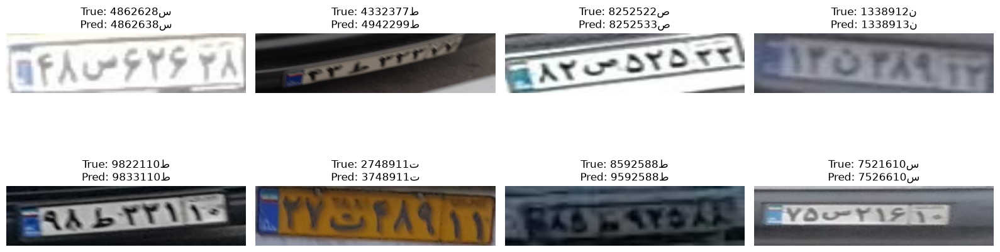

In [132]:
# Load best fine-tuned MobileNet checkpoint
mobilenet_best_checkpoint = torch.load(
    MOBILENET_V3_SMALL_FINETUNE_BEST_PATH,
    map_location=DEVICE
)

mobilenet_v3_small_model.load_state_dict(
    mobilenet_best_checkpoint["model_state_dict"]
)

mobilenet_v3_small_model.eval()


# -------------------------
# Test-set metrics
# -------------------------

test_loss, test_char_acc, test_plate_acc = evaluate_model(
    mobilenet_v3_small_model,
    mobilenet_v3_small_test_loader,
    DEVICE
)

print(f"Test Loss:           {test_loss:.4f}")
print(f"Character Accuracy:  {test_char_acc:.4f}")
print(f"Full Plate Accuracy: {test_plate_acc:.4f}")


# -------------------------
# Collect misclassified plates
# -------------------------

misclassified_samples = []

with torch.no_grad():

    for images, targets in mobilenet_v3_small_test_loader:

        images = images.to(DEVICE)
        targets = targets.to(DEVICE)

        outputs = mobilenet_v3_small_model(images)

        predictions = torch.stack(
            [output.argmax(dim=1) for output in outputs],
            dim=1
        )

        incorrect_mask = ~(
            predictions == targets
        ).all(dim=1)

        incorrect_indices = torch.where(
            incorrect_mask
        )[0]

        for index in incorrect_indices:

            misclassified_samples.append(
                (
                    images[index].cpu(),
                    targets[index].cpu(),
                    predictions[index].cpu()
                )
            )


print(
    "Misclassified plates:",
    len(misclassified_samples)
)


# -------------------------
# Show examples
# -------------------------

num_samples = min(
    8,
    len(misclassified_samples)
)

fig, axes = plt.subplots(
    2,
    4,
    figsize=(16, 6)
)

axes = axes.flatten()

mean = torch.tensor(
    IMAGENET_MEAN
).view(3, 1, 1)

std = torch.tensor(
    IMAGENET_STD
).view(3, 1, 1)

for i in range(num_samples):

    image, target, prediction = (
        misclassified_samples[i]
    )

    # Undo ImageNet normalization for display
    image = image * std + mean
    image = image.clamp(0, 1)

    true_label = label_encoder.decode(target)
    predicted_label = label_encoder.decode(prediction)

    image = image.permute(1, 2, 0)

    axes[i].imshow(image)

    axes[i].set_title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}"
    )

    axes[i].axis("off")


for i in range(
    num_samples,
    len(axes)
):
    axes[i].axis("off")


plt.tight_layout()
plt.show()

#### CNN misclassifications

Test Loss:           0.1316
Character Accuracy:  0.9607
Full Plate Accuracy: 0.8254
Misclassified plates: 429


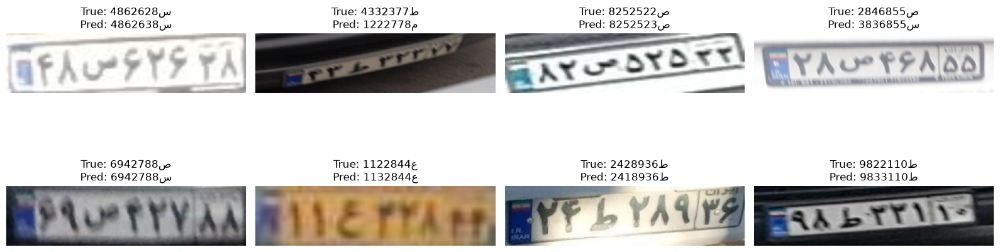

In [133]:
# -------------------------
# Custom CNN test metrics
# -------------------------

custom_test_loss, custom_test_char_acc, custom_test_plate_acc = evaluate_model(
    best_custom_model,
    test_loader,
    DEVICE
)

print(f"Test Loss:           {custom_test_loss:.4f}")
print(f"Character Accuracy:  {custom_test_char_acc:.4f}")
print(f"Full Plate Accuracy: {custom_test_plate_acc:.4f}")


# -------------------------
# Collect misclassified plates
# -------------------------

custom_misclassified_samples = []

best_custom_model.eval()

with torch.no_grad():

    for images, targets in test_loader:

        images = images.to(DEVICE)
        targets = targets.to(DEVICE)

        outputs = best_custom_model(images)

        predictions = torch.stack(
            [output.argmax(dim=1) for output in outputs],
            dim=1
        )

        incorrect_mask = ~(
            predictions == targets
        ).all(dim=1)

        incorrect_indices = torch.where(
            incorrect_mask
        )[0]

        for index in incorrect_indices:

            custom_misclassified_samples.append(
                (
                    images[index].cpu(),
                    targets[index].cpu(),
                    predictions[index].cpu()
                )
            )


print(
    "Misclassified plates:",
    len(custom_misclassified_samples)
)


# -------------------------
# Show examples
# -------------------------

num_samples = min(
    8,
    len(custom_misclassified_samples)
)

fig, axes = plt.subplots(
    2,
    4,
    figsize=(16, 6)
)

axes = axes.flatten()

for i in range(num_samples):

    image, target, prediction = (
        custom_misclassified_samples[i]
    )

    true_label = label_encoder.decode(target)
    predicted_label = label_encoder.decode(prediction)

    image = image.permute(1, 2, 0)

    axes[i].imshow(image)

    axes[i].set_title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}"
    )

    axes[i].axis("off")


for i in range(
    num_samples,
    len(axes)
):
    axes[i].axis("off")


plt.tight_layout()
plt.show()

#### Compare two models

In [134]:
comparison_df = pd.DataFrame({
    "Model": [
        "Custom CNN",
        "MobileNetV3-Small"
    ],

    "Test Loss": [
        custom_test_loss,
        test_loss
    ],

    "Character Accuracy": [
        custom_test_char_acc,
        test_char_acc
    ],

    "Full Plate Accuracy": [
        custom_test_plate_acc,
        test_plate_acc
    ],

    "Misclassified Plates": [
        len(custom_misclassified_samples),
        len(misclassified_samples)
    ],

    "Parameters": [
        sum(
            p.numel()
            for p in best_custom_model.parameters()
        ),

        sum(
            p.numel()
            for p in mobilenet_v3_small_model.parameters()
        )
    ]
})

comparison_df

,Model,Test Loss,Character Accuracy,Full Plate Accuracy,Misclassified Plates,Parameters
0,Custom CNN,0.131632,0.960724,0.825397,429,413020
1,MobileNetV3-Small,0.104403,0.969780,0.861620,340,980092


#### Metrics Comparison Plot

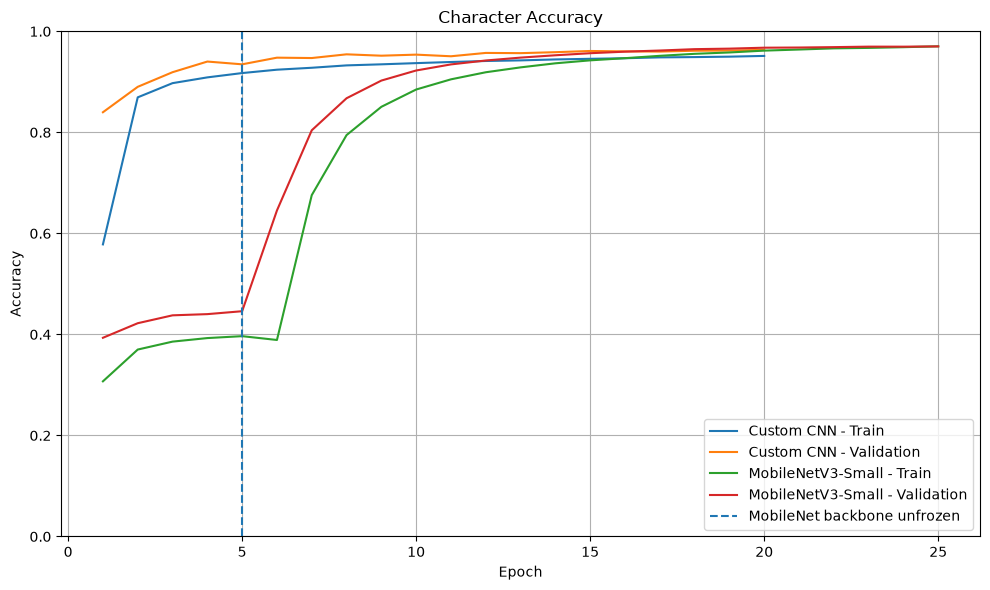

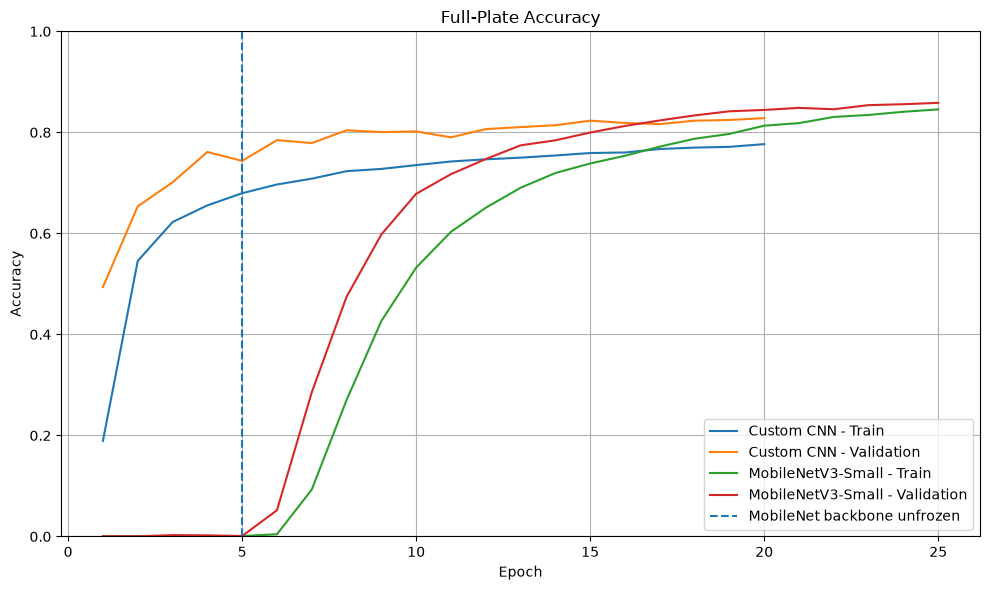

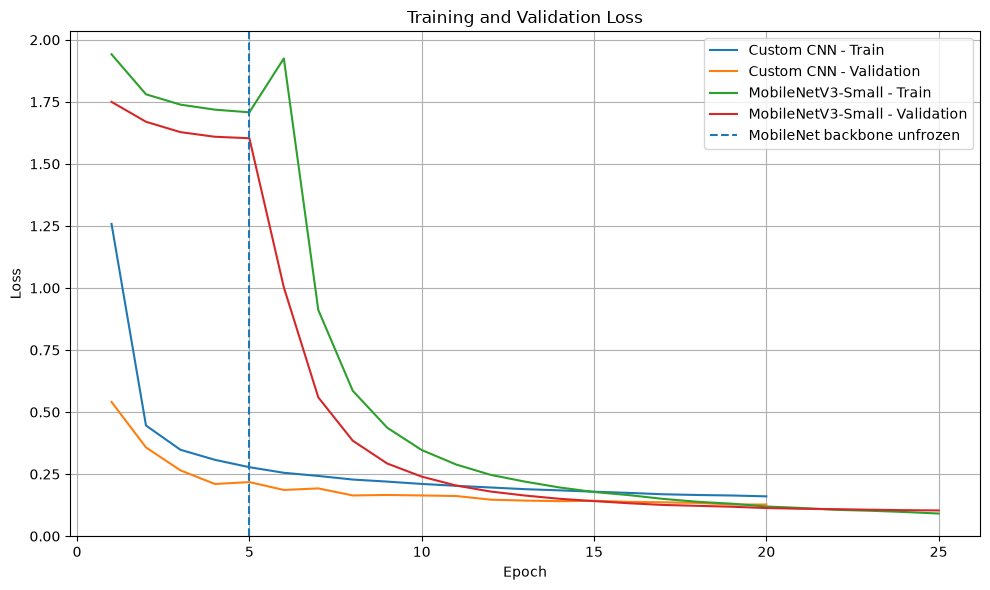

In [135]:
# Load histories
custom_cnn_history_df = pd.read_csv(HISTORY_PATH)

mobilenet_frozen_history_df = pd.read_csv(
    MOBILENET_V3_SMALL_HISTORY_PATH
)

mobilenet_finetune_history_df = pd.read_csv(
    MOBILENET_V3_SMALL_FINETUNE_HISTORY_PATH
)

# Combine MobileNet frozen-backbone + fine-tuning stages
mobilenet_full_history_df = pd.concat(
    [
        mobilenet_frozen_history_df,
        mobilenet_finetune_history_df
    ],
    ignore_index=True
)

custom_epochs = range(1, len(custom_cnn_history_df) + 1)
mobilenet_epochs = range(1, len(mobilenet_full_history_df) + 1)

mobilenet_unfreeze_epoch = len(mobilenet_frozen_history_df)


# -------------------------
# Plot 1: Character accuracy
# -------------------------
plt.figure(figsize=(10, 6))

plt.plot(
    custom_epochs,
    custom_cnn_history_df["train_char_acc"],
    label="Custom CNN - Train"
)

plt.plot(
    custom_epochs,
    custom_cnn_history_df["val_char_acc"],
    label="Custom CNN - Validation"
)

plt.plot(
    mobilenet_epochs,
    mobilenet_full_history_df["train_char_acc"],
    label="MobileNetV3-Small - Train"
)

plt.plot(
    mobilenet_epochs,
    mobilenet_full_history_df["val_char_acc"],
    label="MobileNetV3-Small - Validation"
)

plt.axvline(
    mobilenet_unfreeze_epoch,
    linestyle="--",
    label="MobileNet backbone unfrozen"
)

plt.title("Character Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.ylim(0, 1)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# -------------------------
# Plot 2: Full-plate accuracy
# -------------------------
plt.figure(figsize=(10, 6))

plt.plot(
    custom_epochs,
    custom_cnn_history_df["train_plate_acc"],
    label="Custom CNN - Train"
)

plt.plot(
    custom_epochs,
    custom_cnn_history_df["val_plate_acc"],
    label="Custom CNN - Validation"
)

plt.plot(
    mobilenet_epochs,
    mobilenet_full_history_df["train_plate_acc"],
    label="MobileNetV3-Small - Train"
)

plt.plot(
    mobilenet_epochs,
    mobilenet_full_history_df["val_plate_acc"],
    label="MobileNetV3-Small - Validation"
)

plt.axvline(
    mobilenet_unfreeze_epoch,
    linestyle="--",
    label="MobileNet backbone unfrozen"
)

plt.title("Full-Plate Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.ylim(0, 1)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# -------------------------
# Plot 3: Loss
# -------------------------
plt.figure(figsize=(10, 6))

plt.plot(
    custom_epochs,
    custom_cnn_history_df["train_loss"],
    label="Custom CNN - Train"
)

plt.plot(
    custom_epochs,
    custom_cnn_history_df["val_loss"],
    label="Custom CNN - Validation"
)

plt.plot(
    mobilenet_epochs,
    mobilenet_full_history_df["train_loss"],
    label="MobileNetV3-Small - Train"
)

plt.plot(
    mobilenet_epochs,
    mobilenet_full_history_df["val_loss"],
    label="MobileNetV3-Small - Validation"
)

plt.axvline(
    mobilenet_unfreeze_epoch,
    linestyle="--",
    label="MobileNet backbone unfrozen"
)

plt.title("Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## 3. End-to-End License Plate Detection & Recognition

### End-to-End License Plate Pipeline

The final system combines the trained license plate detector and recognizer into one pipeline.

```text
Input image
    ↓
YOLO License Plate Detector
    ↓
Plate bounding box
    ↓
Crop detected plate
    ↓
MobileNetV3-Small License Plate Recognizer
    ↓
Eight position-specific predictions
    ↓
Decode class indices
    ↓
Final license plate string

In [136]:
# TODO: Load the trained models for both LPD and LPR

# --------------------------------------------------
# 1. Load License Plate Detection model (YOLO)
# --------------------------------------------------

lpd_yolo_model = YOLO(
    str(BASELINE_WEIGHTS)
)

print("LPD model loaded from:")
print(BASELINE_WEIGHTS)


# --------------------------------------------------
# 2. Load best License Plate Recognition model
#    (fine-tuned MobileNetV3-Small)
# --------------------------------------------------

lpr_mobilenet_checkpoint = torch.load(
    MOBILENET_V3_SMALL_FINETUNE_BEST_PATH,
    map_location=DEVICE
)

lpr_mobilenet_model = MobileNetV3SmallPlateRecognizer(
    num_digit_classes=len(
        lpr_mobilenet_checkpoint["digit_classes"]
    ),
    num_letter_classes=len(
        lpr_mobilenet_checkpoint["letter_classes"]
    )
).to(DEVICE)

lpr_mobilenet_model.load_state_dict(
    lpr_mobilenet_checkpoint["model_state_dict"]
)

lpr_mobilenet_model.eval()


# --------------------------------------------------
# 3. Verify label mappings
# --------------------------------------------------

assert (
    lpr_mobilenet_checkpoint["digit_classes"]
    == label_encoder.digit_classes
)

assert (
    lpr_mobilenet_checkpoint["letter_classes"]
    == label_encoder.letter_classes
)


print("\nLPR model loaded from:")
print(MOBILENET_V3_SMALL_FINETUNE_BEST_PATH)

print(
    "LPR checkpoint epoch:",
    lpr_mobilenet_checkpoint["epoch"]
)

print("\nBoth LPD and LPR models loaded successfully.")

LPD model loaded from:
/Users/mahya/code/license_plate_detection/models/detector/yolo_baseline/weights/best.pt

LPR model loaded from:
/Users/mahya/code/license_plate_detection/models/recognizer/mobilenet_v3_small/fine_tuning/best.pt
LPR checkpoint epoch: 20

Both LPD and LPR models loaded successfully.


In [142]:
class LicensePlatePipeline:

    def __init__(
        self,
        detector,
        recognizer,
        recognition_transform,
        label_encoder,
        device,
        detector_confidence=0.25
    ):
        self.detector = detector
        self.recognizer = recognizer
        self.recognition_transform = recognition_transform
        self.label_encoder = label_encoder
        self.device = device
        self.detector_confidence = detector_confidence

        self.recognizer.eval()


    def predict(self, image_path):

        image_path = Path(image_path)

        # Load original image for cropping
        image = Image.open(image_path).convert("RGB")

        # -----------------------------------------
        # 1. Detect license plates
        # -----------------------------------------
        detection_results = self.detector.predict(
            source=str(image_path),
            conf=self.detector_confidence,
            device=self.device,
            verbose=False
        )

        detection_result = detection_results[0]

        predictions = []

        # No detected plates
        if detection_result.boxes is None:
            return predictions


        # -----------------------------------------
        # 2. Process each detected plate
        # -----------------------------------------
        for box in detection_result.boxes:

            # YOLO bounding box: x1, y1, x2, y2
            x1, y1, x2, y2 = (
                box.xyxy[0]
                .detach()
                .cpu()
                .tolist()
            )

            # Keep coordinates inside image boundaries
            x1 = max(0, int(x1))
            y1 = max(0, int(y1))
            x2 = min(image.width, int(x2))
            y2 = min(image.height, int(y2))

            detection_confidence = (
                box.conf[0]
                .detach()
                .cpu()
                .item()
            )

            # -----------------------------------------
            # 3. Crop detected plate
            # -----------------------------------------
            plate_crop = image.crop(
                (x1, y1, x2, y2)
            )

            # -----------------------------------------
            # 4. Preprocess crop for MobileNet
            # -----------------------------------------
            plate_tensor = (
                self.recognition_transform(plate_crop)
                .unsqueeze(0)
                .to(self.device)
            )

            # -----------------------------------------
            # 5. Recognize plate characters
            # -----------------------------------------
            with torch.no_grad():

                outputs = self.recognizer(
                    plate_tensor
                )

                predicted_indices = []
                character_confidences = []

                for output in outputs:

                    probabilities = torch.softmax(
                        output,
                        dim=1
                    )

                    confidence, predicted_class = (
                        probabilities.max(dim=1)
                    )

                    predicted_indices.append(
                        predicted_class.item()
                    )

                    character_confidences.append(
                        confidence.item()
                    )


            # -----------------------------------------
            # 6. Decode predictions into plate string
            # -----------------------------------------
            plate_text = self.label_encoder.decode(
                predicted_indices
            )

            recognition_confidence = (
                sum(character_confidences)
                / len(character_confidences)
            )


            predictions.append({
                "bbox": (x1, y1, x2, y2),
                "detection_confidence": detection_confidence,
                "plate_text": plate_text,
                "character_confidences": character_confidences,
                "recognition_confidence": recognition_confidence,
                "plate_crop": plate_crop
            })


        return predictions
"""output
bbox
detection confidence
predicted plate text
confidence for each of the 8 characters
average recognition confidence
plate crop"""



'output\nbbox\ndetection confidence\npredicted plate text\nconfidence for each of the 8 characters\naverage recognition confidence\nplate crop'

#### instantiate the pipeline and test one image

In [143]:
license_plate_pipeline = LicensePlatePipeline(
    detector=lpd_yolo_model,
    recognizer=lpr_mobilenet_model,
    recognition_transform=mobilenet_v3_small_eval_transform,
    label_encoder=label_encoder,
    device=DEVICE,
    detector_confidence=0.25
)

# Pick one image from the LPD test set
test_image_path = sorted(
    (LPD_DIR / "images" / "test").glob("*.jpg")
)[0]

predictions = license_plate_pipeline.predict(
    test_image_path
)

print("Test image:", test_image_path.name)
print("Number of detected plates:", len(predictions))

for i, prediction in enumerate(predictions, start=1):

    print(f"\nPlate {i}")
    print("Bounding box:", prediction["bbox"])
    print(
        "Detection confidence:",
        f"{prediction['detection_confidence']:.3f}"
    )
    print(
        "Predicted text:",
        prediction["plate_text"]
    )
    print(
        "Recognition confidence:",
        f"{prediction['recognition_confidence']:.3f}"
    )

Test image: 000020.jpg
Number of detected plates: 1

Plate 1
Bounding box: (213, 281, 442, 335)
Detection confidence: 0.876
Predicted text: 77ق12233
Recognition confidence: 0.991


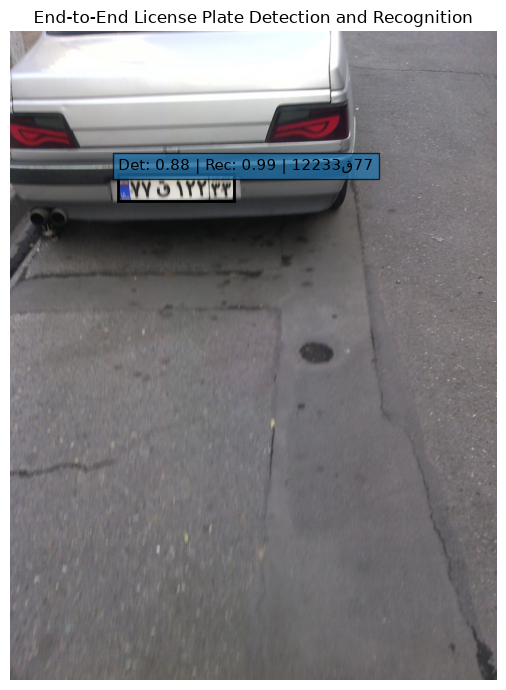

In [144]:
import matplotlib.patches as patches

image = Image.open(test_image_path).convert("RGB")

fig, ax = plt.subplots(figsize=(12, 7))

ax.imshow(image)

for prediction in predictions:

    x1, y1, x2, y2 = prediction["bbox"]

    width = x2 - x1
    height = y2 - y1

    # Bounding box
    rectangle = patches.Rectangle(
        (x1, y1),
        width,
        height,
        linewidth=2,
        fill=False
    )

    ax.add_patch(rectangle)

    # Prediction text
    label = (
        f"{prediction['plate_text']} | "
        f"Det: {prediction['detection_confidence']:.2f} | "
        f"Rec: {prediction['recognition_confidence']:.2f}"
    )

    ax.text(
        x1,
        max(0, y1 - 8),
        label,
        fontsize=11,
        bbox=dict(alpha=0.7)
    )

ax.set_title("End-to-End License Plate Detection and Recognition")
ax.axis("off")

plt.tight_layout()
plt.show()

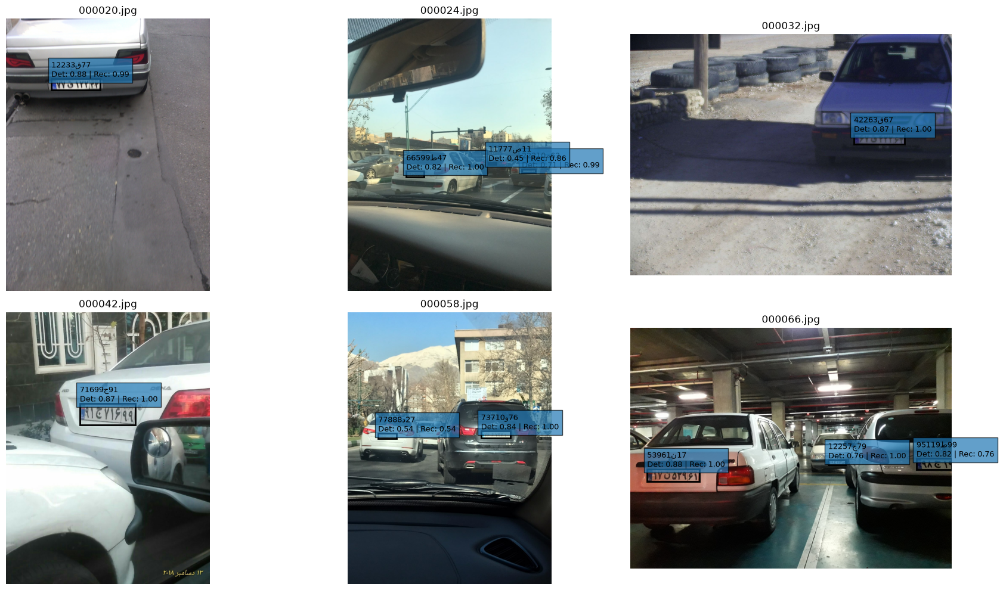

In [145]:
sample_test_images = sorted(
    (LPD_DIR / "images" / "test").glob("*.jpg")
)[:6]

fig, axes = plt.subplots(
    2,
    3,
    figsize=(18, 10)
)

axes = axes.flatten()

for ax, image_path in zip(axes, sample_test_images):

    image = Image.open(image_path).convert("RGB")

    predictions = license_plate_pipeline.predict(
        image_path
    )

    ax.imshow(image)

    if len(predictions) == 0:

        ax.set_title(
            f"{image_path.name}\nNo plate detected"
        )

    else:

        for prediction in predictions:

            x1, y1, x2, y2 = prediction["bbox"]

            rectangle = patches.Rectangle(
                (x1, y1),
                x2 - x1,
                y2 - y1,
                linewidth=2,
                fill=False
            )

            ax.add_patch(rectangle)

            label = (
                f"{prediction['plate_text']}\n"
                f"Det: {prediction['detection_confidence']:.2f} | "
                f"Rec: {prediction['recognition_confidence']:.2f}"
            )

            ax.text(
                x1,
                max(0, y1 - 8),
                label,
                fontsize=9,
                bbox=dict(alpha=0.7)
            )

        ax.set_title(image_path.name)

    ax.axis("off")

plt.tight_layout()
plt.show()